In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [3]:
import os
print(os.getcwd())

C:\Users\Katarina\OneDrive\Desktop\SB


In [5]:
import pandas as pd
import os

file_path = r"C:\Users\Katarina\OneDrive\Desktop\improved_cleaned_enhanced_data.csv"
df = pd.read_csv(file_path)

In [6]:
print(df.info())
print(df.head())
print(df.describe())
print(df.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6398 entries, 0 to 6397
Data columns (total 49 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ticker                     6398 non-null   object 
 1   name                       6398 non-null   object 
 2   sector                     6398 non-null   object 
 3   industry                   6398 non-null   object 
 4   scalemarketcap             6398 non-null   object 
 5   firstpricedate             6398 non-null   object 
 6   lastpricedate              6398 non-null   object 
 7   revenue                    6398 non-null   float64
 8   netinc                     6398 non-null   float64
 9   assets                     6398 non-null   float64
 10  liabilities                6398 non-null   float64
 11  equity                     6398 non-null   float64
 12  fcf                        6398 non-null   float64
 13  ebitda                     6398 non-null   float

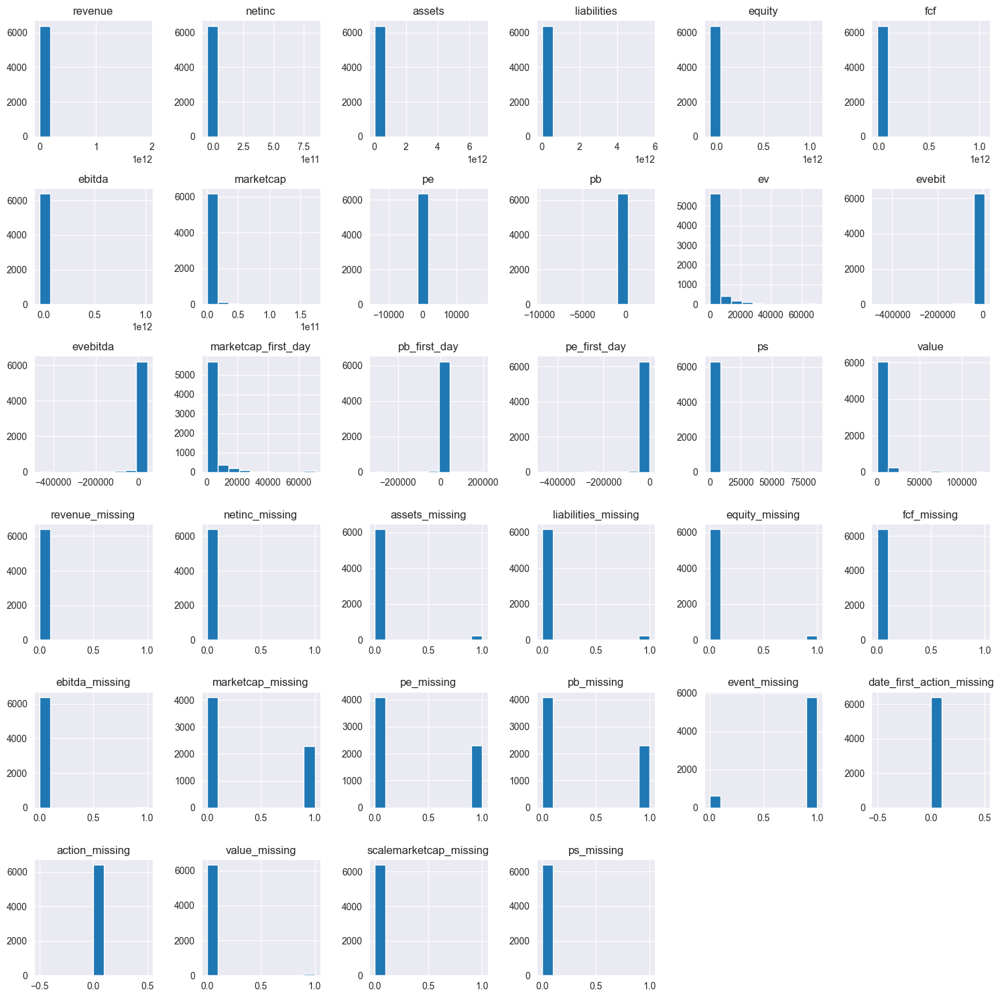

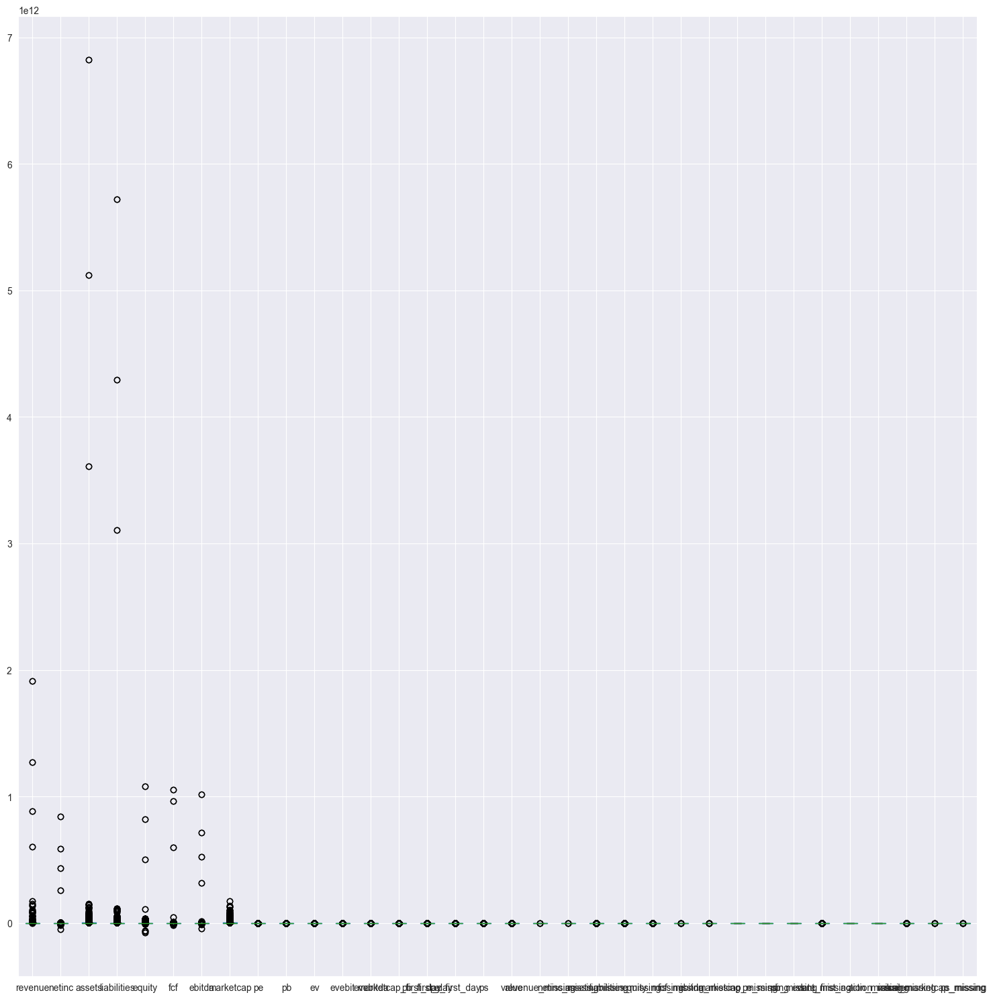

In [7]:
# Histogram of numerical columns
df.hist(figsize=(15, 15))
plt.tight_layout()
plt.show()

# Box plots for numerical columns
df.boxplot(figsize=(15, 15))
plt.tight_layout()
plt.show()

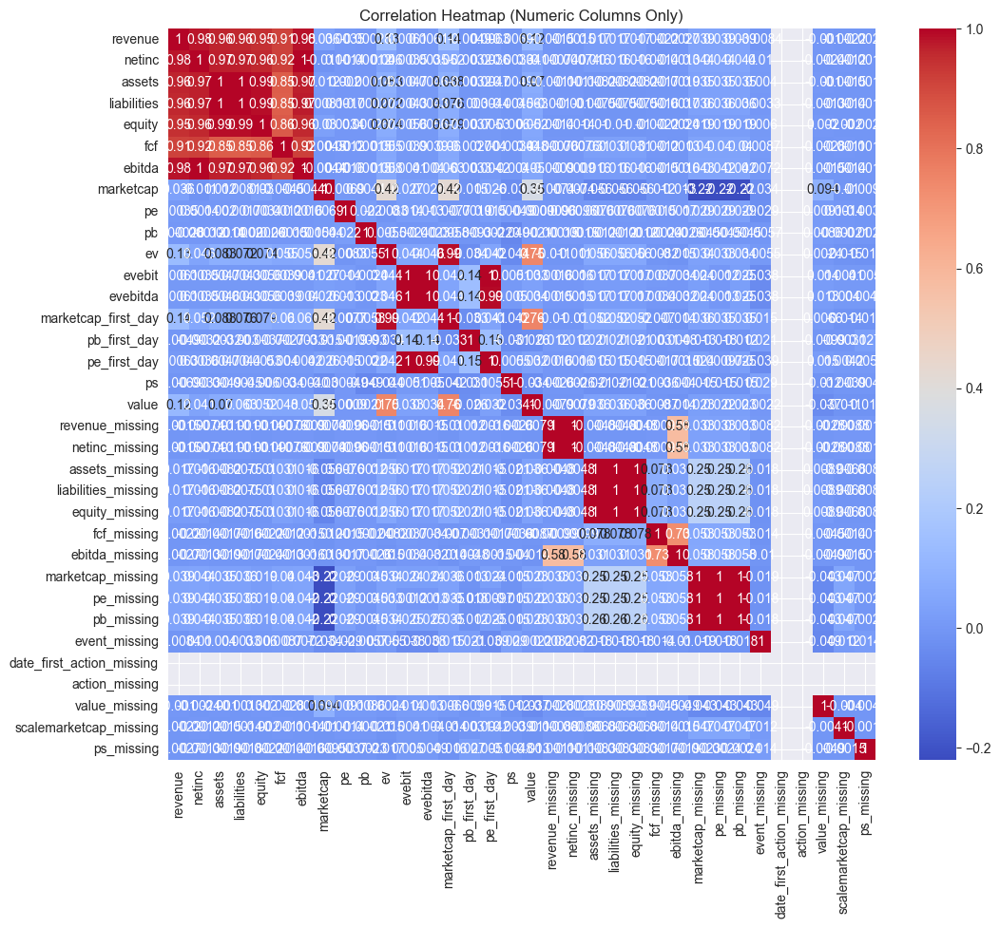

In [9]:
numeric_columns = df.select_dtypes(include=[np.number]).columns
corr = df[numeric_columns].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap (Numeric Columns Only)')
plt.show()

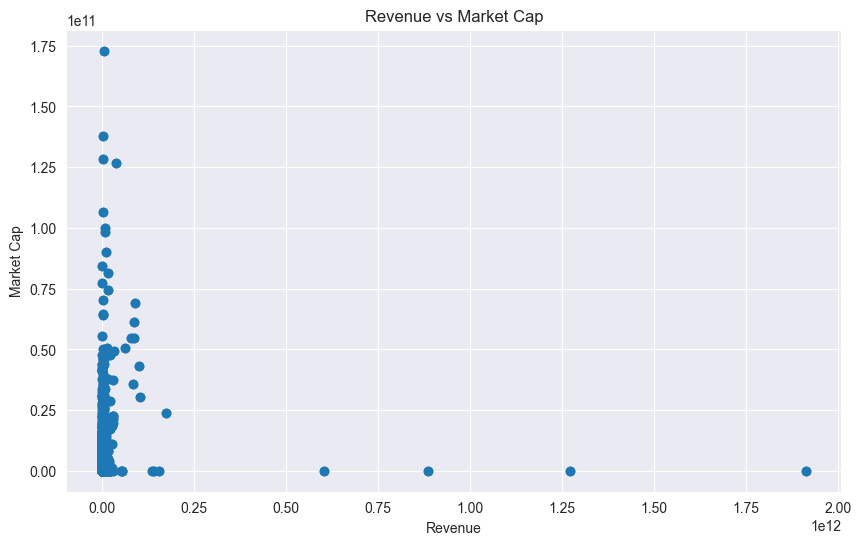

In [10]:
# Scatter plot of market cap vs revenue
plt.figure(figsize=(10, 6))
plt.scatter(df['revenue'], df['marketcap'])
plt.xlabel('Revenue')
plt.ylabel('Market Cap')
plt.title('Revenue vs Market Cap')
plt.show()

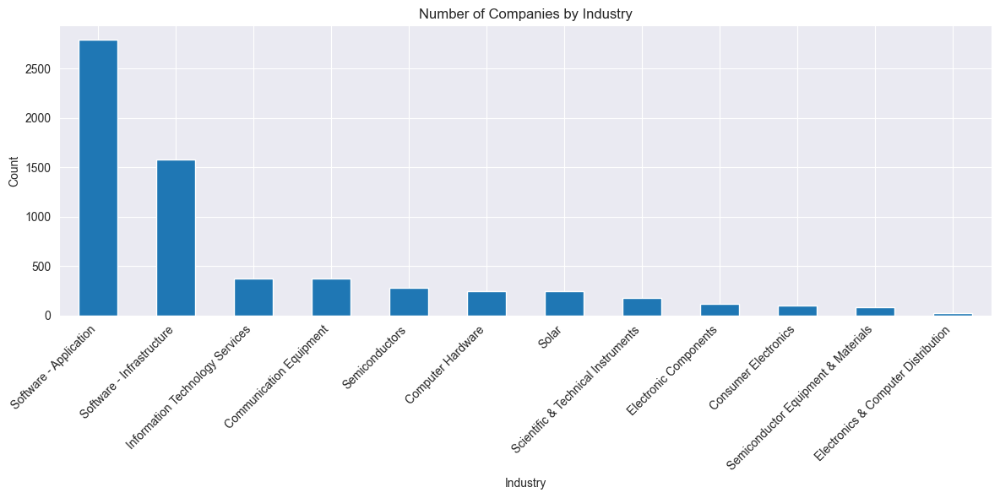

In [11]:
# Bar plot of companies by industry
industry_counts = df['industry'].value_counts()
plt.figure(figsize=(12, 6))
industry_counts.plot(kind='bar')
plt.title('Number of Companies by Industry')
plt.xlabel('Industry')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

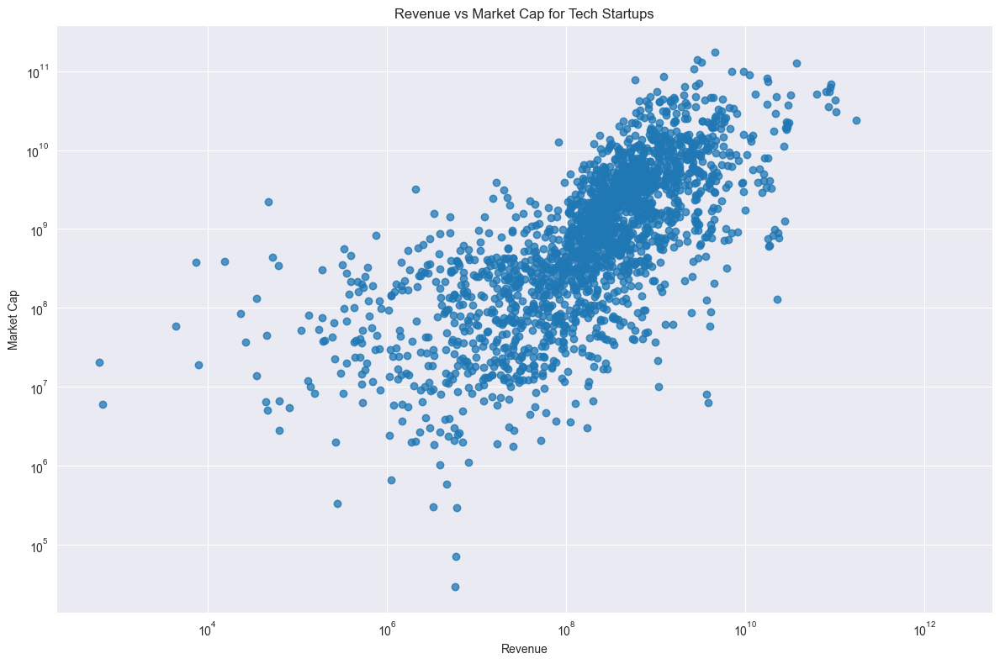

In [14]:
plt.figure(figsize=(12, 8))
plt.scatter(df['revenue'], df['marketcap'], alpha=0.5)
plt.xlabel('Revenue')
plt.ylabel('Market Cap')
plt.title('Revenue vs Market Cap for Tech Startups')
plt.xscale('log')
plt.yscale('log')
plt.tight_layout()
plt.show()

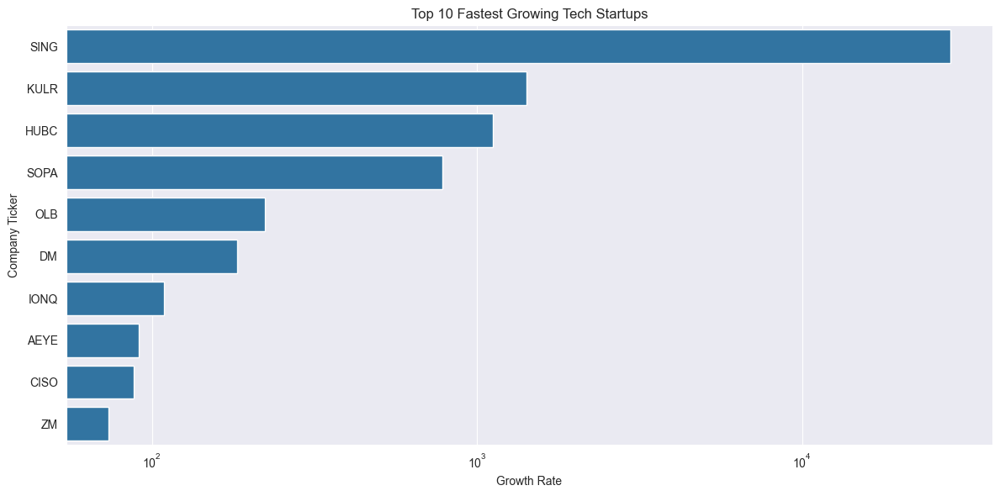

     ticker                           name   growth_rate
5034   SING                SINGLEPOINT INC  28545.489154
3169   KULR      KULR TECHNOLOGY GROUP INC   1423.661739
2626   HUBC         HUB CYBER SECURITY LTD   1121.552632
5183   SOPA      SOCIETY PASS INCORPORATED    783.903948
4082    OLB                  OLB GROUP INC    222.987728
1789     DM              DESKTOP METAL INC    182.460348
2881   IONQ                       IONQ INC    109.210000
68     AEYE                   AUDIOEYE INC     91.414929
1263   CISO                CISO GLOBAL INC     87.931146
6350     ZM  ZOOM VIDEO COMMUNICATIONS INC     73.440107


In [17]:
import seaborn as sns
import numpy as np

# Calculate growth rate using the first and last available revenue data points
df['growth_rate'] = (df.groupby('ticker')['revenue'].transform('last') - 
                     df.groupby('ticker')['revenue'].transform('first')) / \
                    df.groupby('ticker')['revenue'].transform('first')

# Remove infinite values and sort
df = df[np.isfinite(df['growth_rate'])]
top_growing = df.sort_values('growth_rate', ascending=False).drop_duplicates('ticker').head(10)

# Create the plot
plt.figure(figsize=(12, 6))
sns.barplot(x='growth_rate', y='ticker', data=top_growing)
plt.title('Top 10 Fastest Growing Tech Startups')
plt.xlabel('Growth Rate')
plt.ylabel('Company Ticker')
plt.xscale('log')  # Use log scale for better visualization
plt.tight_layout()
plt.show()

# Print the top growing companies for verification
print(top_growing[['ticker', 'name', 'growth_rate']])

In [21]:
df_analysis = df.copy()

# Use .loc to set the 'year' column
df_analysis.loc[:, 'year'] = pd.to_datetime(df_analysis['firstpricedate']).dt.year

# Perform the groupby operation on the new DataFrame
yearly_performance = df_analysis.groupby('year').agg({
    'revenue': 'mean',
    'netinc': 'mean',
    'marketcap': 'mean',
    'pe': 'mean'
}).reset_index()

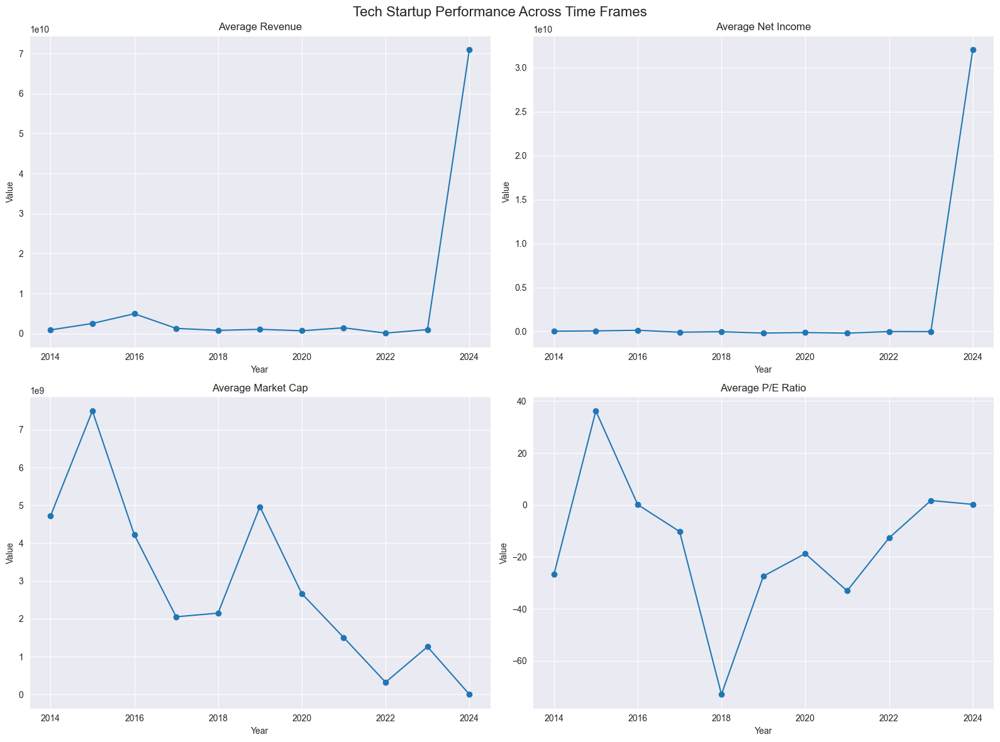

In [19]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Tech Startup Performance Across Time Frames', fontsize=16)

metrics = ['revenue', 'netinc', 'marketcap', 'pe']
titles = ['Average Revenue', 'Average Net Income', 'Average Market Cap', 'Average P/E Ratio']

for i, (metric, title) in enumerate(zip(metrics, titles)):
    ax = axes[i // 2, i % 2]
    ax.plot(yearly_performance['year'], yearly_performance[metric], marker='o')
    ax.set_title(title)
    ax.set_xlabel('Year')
    ax.set_ylabel('Value')
    ax.grid(True)

plt.tight_layout()
plt.show()

In [22]:
def calculate_cagr(start_value, end_value, num_years):
    if start_value <= 0 or end_value <= 0:
        return float('nan')
    return (end_value / start_value) ** (1 / num_years) - 1

start_year = yearly_performance['year'].min()
end_year = yearly_performance['year'].max()
num_years = end_year - start_year

for metric in metrics:
    start_value = yearly_performance[yearly_performance['year'] == start_year][metric].values[0]
    end_value = yearly_performance[yearly_performance['year'] == end_year][metric].values[0]
    cagr = calculate_cagr(start_value, end_value, num_years)
    if np.isnan(cagr):
        print(f"CAGR for {metric}: Not applicable (negative or zero values)")
    else:
        print(f"CAGR for {metric}: {cagr:.2%}")

CAGR for revenue: 54.95%
CAGR for netinc: 106.03%
CAGR for marketcap: -58.18%
CAGR for pe: Not applicable (negative or zero values)


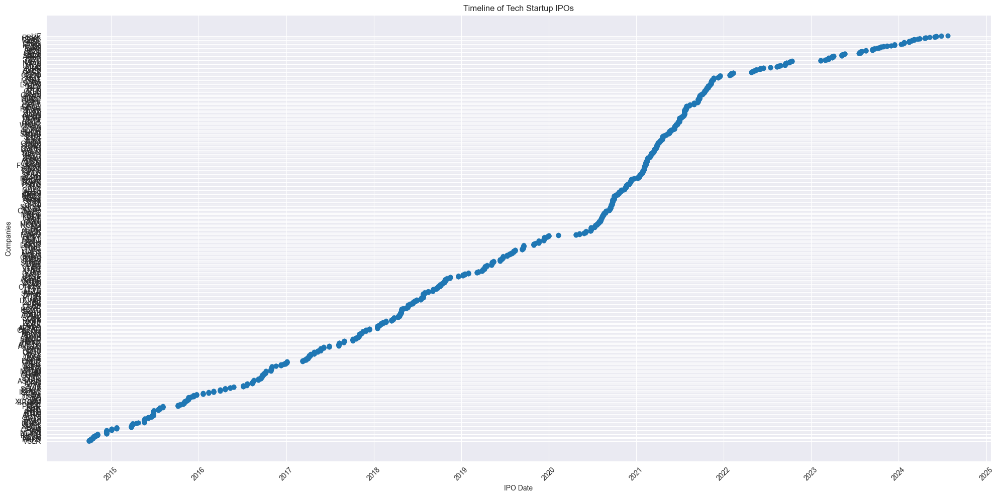

In [24]:
# Create a copy of the DataFrame to ensure we're working with a fresh dataset
df_timeline = df.copy()

# Use .loc to set the 'firstpricedate' column
df_timeline.loc[:, 'firstpricedate'] = pd.to_datetime(df_timeline['firstpricedate'])

# Sort the DataFrame by firstpricedate
df_sorted = df_timeline.sort_values('firstpricedate')

# Create the plot
plt.figure(figsize=(20, 10))
plt.scatter(df_sorted['firstpricedate'], range(len(df_sorted)), alpha=0.5)
plt.yticks(range(0, len(df_sorted), 20), df_sorted['ticker'][::20])
plt.xlabel('IPO Date')
plt.ylabel('Companies')
plt.title('Timeline of Tech Startup IPOs')
plt.grid(True, axis='x')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [25]:
df['market_cap_growth'] = df.groupby('ticker')['marketcap'].pct_change()
df['revenue_growth'] = df.groupby('ticker')['revenue'].pct_change()

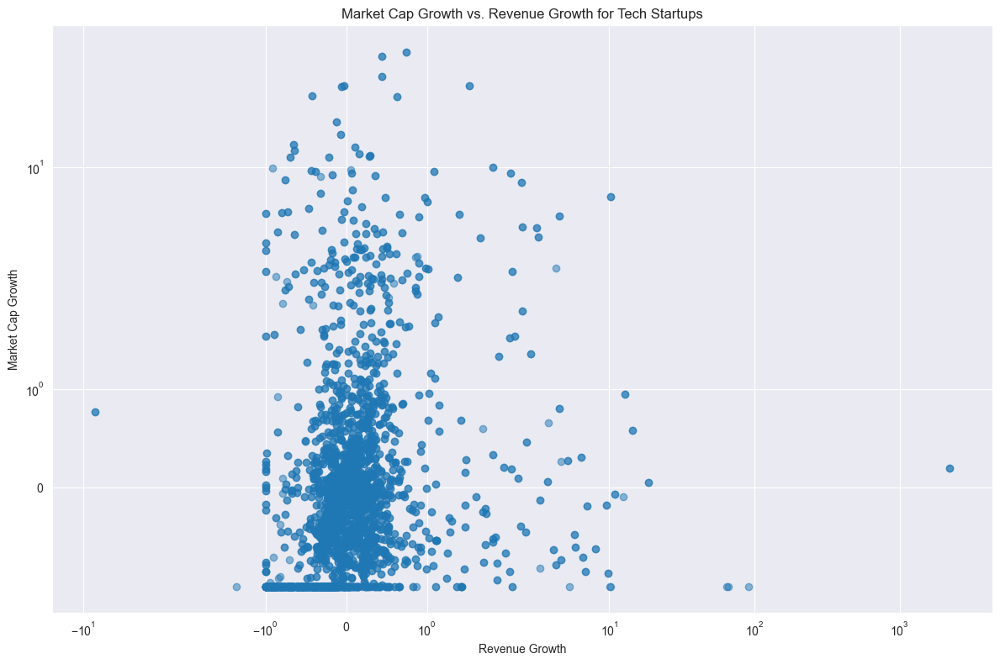

In [26]:
plt.figure(figsize=(12, 8))
plt.scatter(df['revenue_growth'], df['market_cap_growth'], alpha=0.5)
plt.xlabel('Revenue Growth')
plt.ylabel('Market Cap Growth')
plt.title('Market Cap Growth vs. Revenue Growth for Tech Startups')
plt.xscale('symlog')
plt.yscale('symlog')
plt.grid(True)
plt.tight_layout()
plt.show()

In [28]:
# Remove NaN and infinite values
df_clean = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['market_cap_growth', 'revenue_growth'])

# Calculate correlation
correlation = df_clean['market_cap_growth'].corr(df_clean['revenue_growth'])
print(f"Correlation between Market Cap Growth and Revenue Growth: {correlation:.2f}")

Correlation between Market Cap Growth and Revenue Growth: -0.00


In [29]:
df['initial_revenue'] = df.groupby('ticker')['revenue'].transform('first')
df['initial_marketcap'] = df.groupby('ticker')['marketcap'].transform('first')
df['initial_netinc'] = df.groupby('ticker')['netinc'].transform('first')

df['revenue_growth'] = df.groupby('ticker')['revenue'].pct_change()
df['marketcap_growth'] = df.groupby('ticker')['marketcap'].pct_change()
df['netinc_growth'] = df.groupby('ticker')['netinc'].pct_change()

In [30]:
correlations = df[['initial_revenue', 'initial_marketcap', 'initial_netinc',
                   'revenue_growth', 'marketcap_growth', 'netinc_growth']].corr()

print("Correlations between initial financials and subsequent growth:")
print(correlations.loc[['initial_revenue', 'initial_marketcap', 'initial_netinc'], 
                       ['revenue_growth', 'marketcap_growth', 'netinc_growth']])

Correlations between initial financials and subsequent growth:
                   revenue_growth  marketcap_growth  netinc_growth
initial_revenue         -0.003059         -0.028970      -0.001388
initial_marketcap       -0.006712         -0.047996      -0.005880
initial_netinc          -0.001267         -0.012776      -0.001445


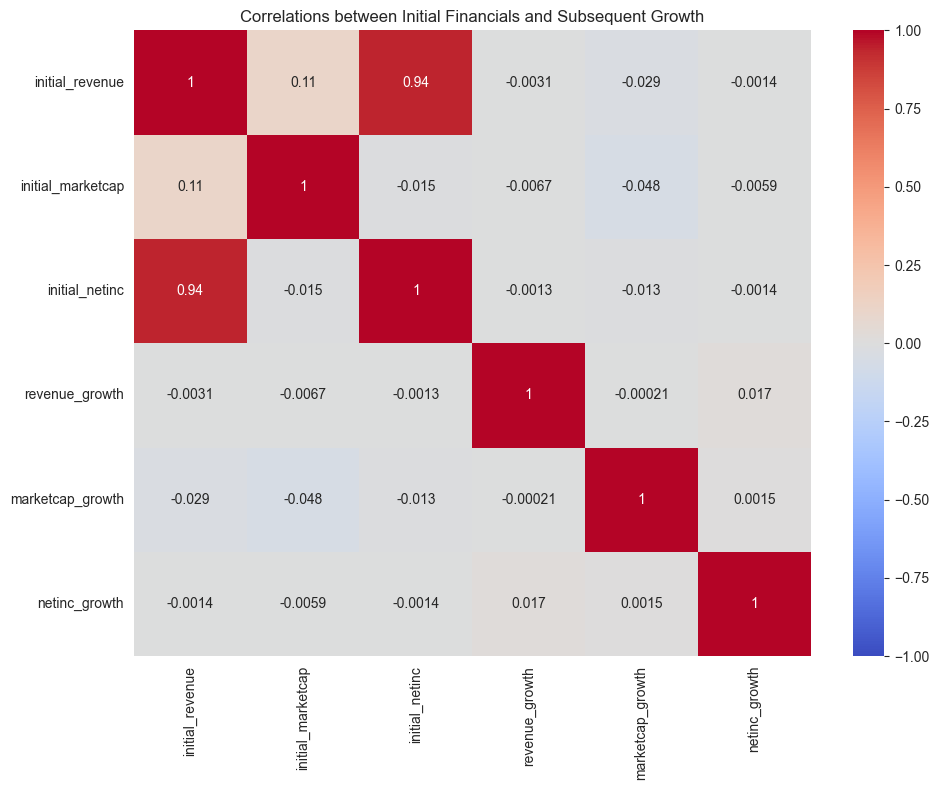

In [31]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlations, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlations between Initial Financials and Subsequent Growth')
plt.tight_layout()
plt.show()

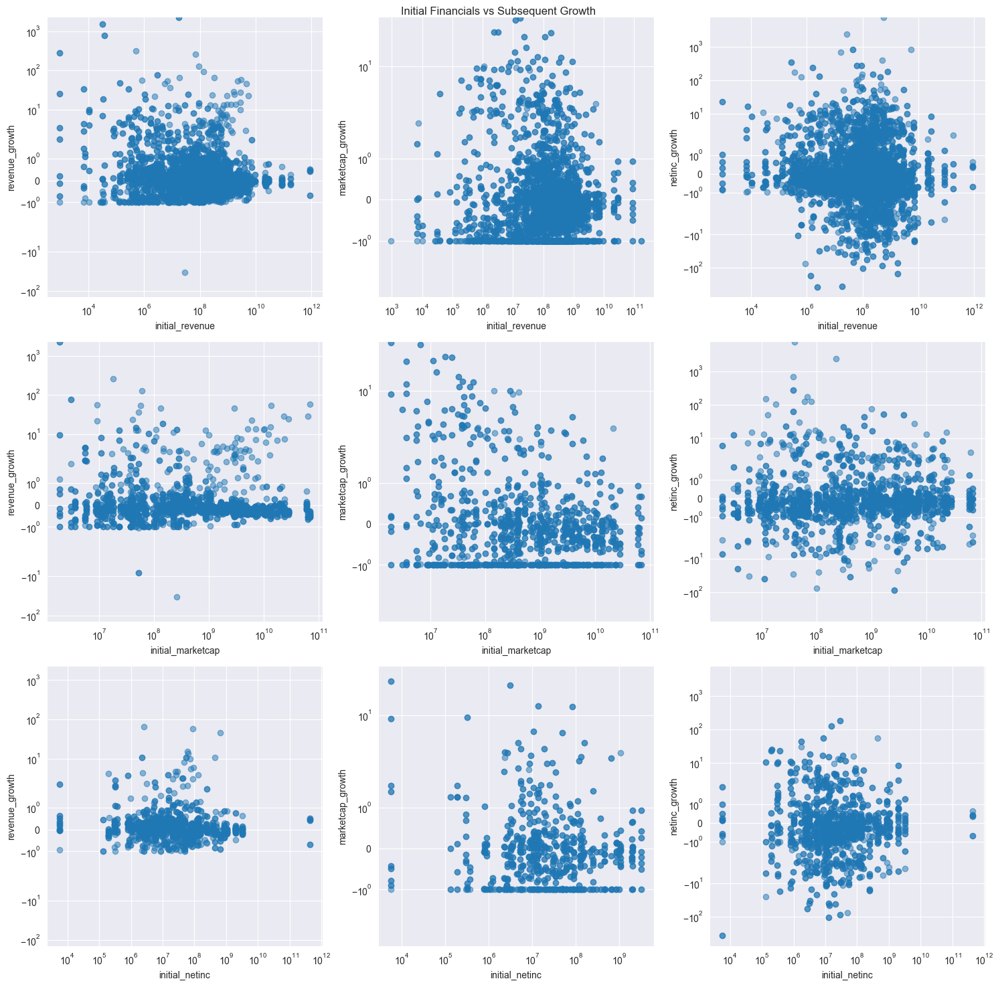

In [32]:
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
fig.suptitle('Initial Financials vs Subsequent Growth')

initial_vars = ['initial_revenue', 'initial_marketcap', 'initial_netinc']
growth_vars = ['revenue_growth', 'marketcap_growth', 'netinc_growth']

for i, initial_var in enumerate(initial_vars):
    for j, growth_var in enumerate(growth_vars):
        axes[i, j].scatter(df[initial_var], df[growth_var], alpha=0.5)
        axes[i, j].set_xlabel(initial_var)
        axes[i, j].set_ylabel(growth_var)
        axes[i, j].set_xscale('log')
        axes[i, j].set_yscale('symlog')

plt.tight_layout()
plt.show()

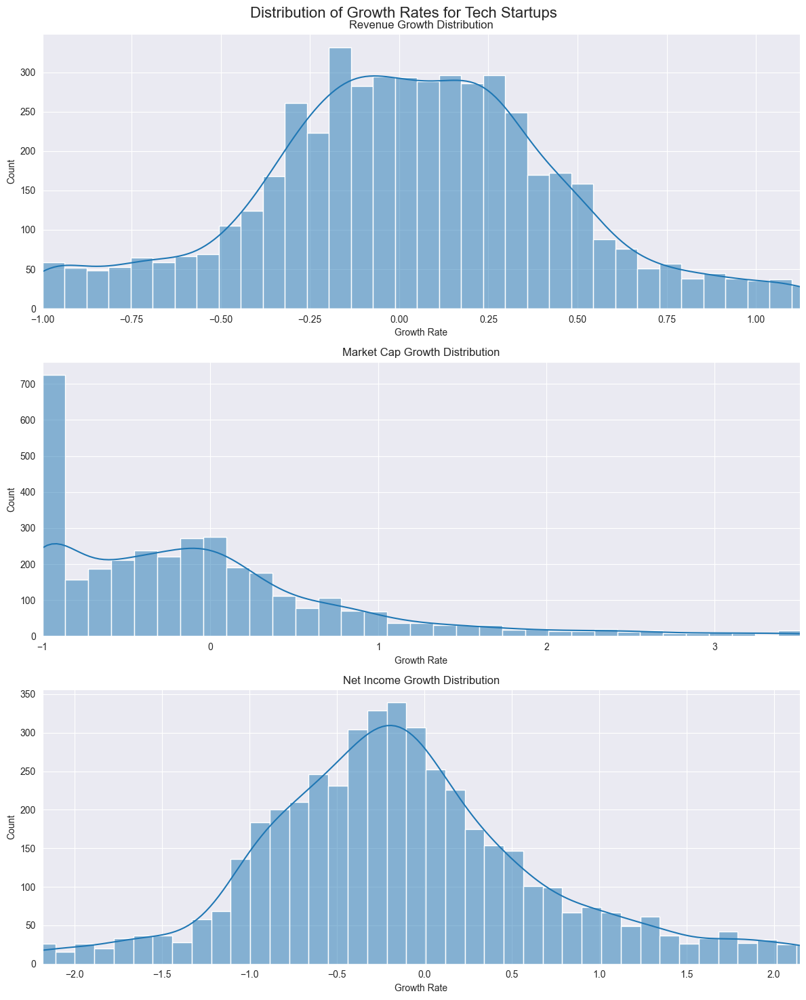

In [34]:
def remove_outliers(data, factor=1.5):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    return data[(data >= lower_bound) & (data <= upper_bound)]

# Create a figure with subplots
fig, axes = plt.subplots(3, 1, figsize=(12, 15))
fig.suptitle('Distribution of Growth Rates for Tech Startups', fontsize=16)

growth_metrics = ['revenue_growth', 'marketcap_growth', 'netinc_growth']
titles = ['Revenue Growth Distribution', 'Market Cap Growth Distribution', 'Net Income Growth Distribution']

for i, (metric, title) in enumerate(zip(growth_metrics, titles)):
    data = remove_outliers(df[metric].dropna())
    sns.histplot(data, kde=True, ax=axes[i])
    axes[i].set_title(title)
    axes[i].set_xlabel('Growth Rate')
    axes[i].set_xlim(data.quantile(0.01), data.quantile(0.99))  # Focus on 1st to 99th percentile

plt.tight_layout()
plt.show()

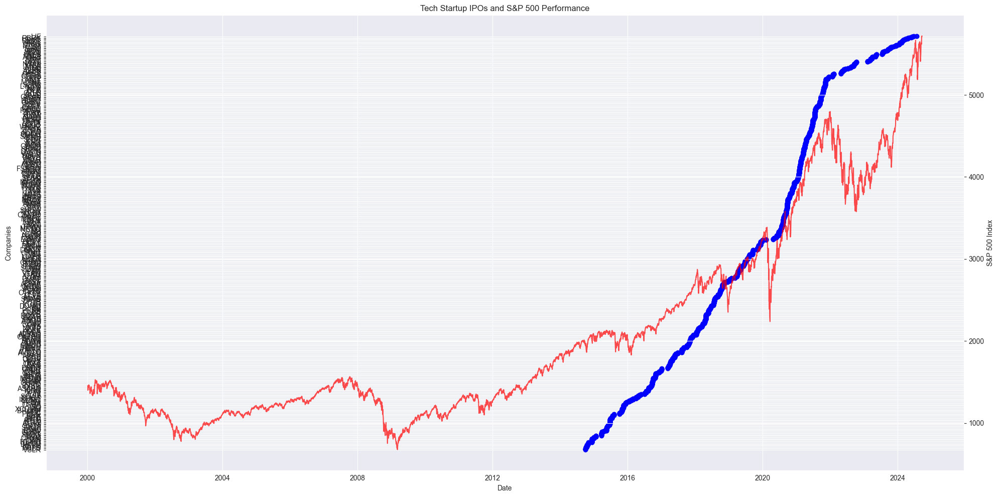

In [37]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Fetch S&P 500 data as a proxy for market conditions
sp500 = yf.Ticker("^GSPC")
market_data = sp500.history(start="2000-01-01")

# Prepare the IPO data
df['firstpricedate'] = pd.to_datetime(df['firstpricedate'])
df_sorted = df.sort_values('firstpricedate')

# Create the plot
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot IPOs
ax1.scatter(df_sorted['firstpricedate'], range(len(df_sorted)), alpha=0.5, color='blue')
ax1.set_yticks(range(0, len(df_sorted), 20))
ax1.set_yticklabels(df_sorted['ticker'][::20])
ax1.set_ylabel('Companies')
ax1.set_xlabel('Date')

# Plot S&P 500 index
ax2 = ax1.twinx()
ax2.plot(market_data.index, market_data['Close'], color='red', alpha=0.7)
ax2.set_ylabel('S&P 500 Index')

plt.title('Tech Startup IPOs and S&P 500 Performance')
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

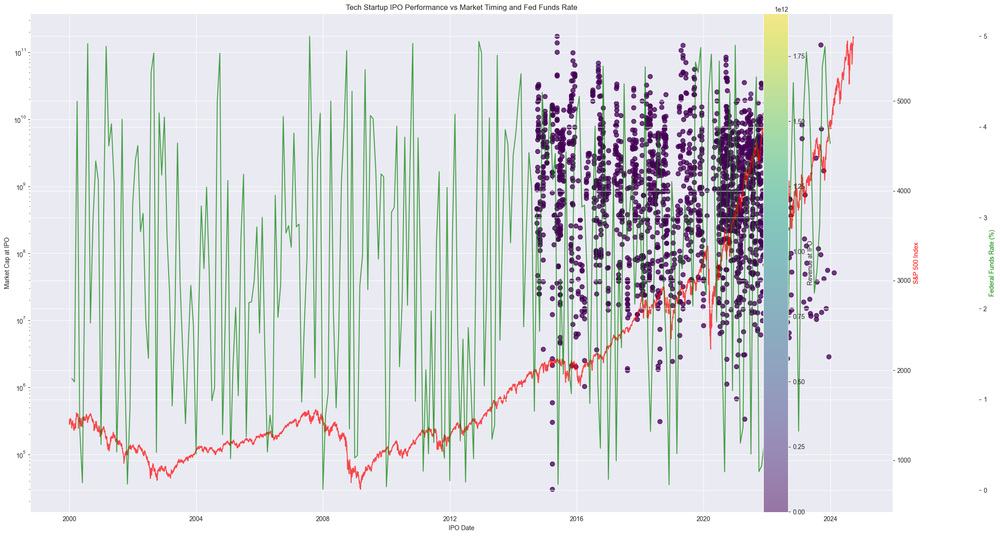

In [41]:
sp500 = yf.Ticker("^GSPC")
market_data = sp500.history(start="2000-01-01")

date_range = pd.date_range(start='2000-01-01', end='2023-12-31', freq='ME')
ffr_data = pd.Series(np.random.uniform(0, 5, len(date_range)), index=date_range)

# Prepare the IPO data
df['firstpricedate'] = pd.to_datetime(df['firstpricedate'])
df_sorted = df.sort_values('firstpricedate')

# Create the plot
fig, ax1 = plt.subplots(figsize=(20, 12))

# Plot IPOs
scatter = ax1.scatter(df_sorted['firstpricedate'], df_sorted['marketcap'], 
                      alpha=0.5, c=df_sorted['revenue'], cmap='viridis', s=50)
ax1.set_ylabel('Market Cap at IPO')
ax1.set_xlabel('IPO Date')
ax1.set_yscale('log')

# Plot S&P 500 index
ax2 = ax1.twinx()
ax2.plot(market_data.index, market_data['Close'], color='red', alpha=0.7)
ax2.set_ylabel('S&P 500 Index', color='red')

# Plot Federal Funds Rate
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('axes', 1.1))
ax3.plot(ffr_data.index, ffr_data.values, color='green', alpha=0.7)
ax3.set_ylabel('Federal Funds Rate (%)', color='green')

plt.title('Tech Startup IPO Performance vs Market Timing and Fed Funds Rate')
plt.colorbar(scatter, label='Revenue at IPO')
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

In [1]:
from dotenv import load_dotenv
import os

load_dotenv()

fred_api_key = os.getenv('FRED_API_KEY')

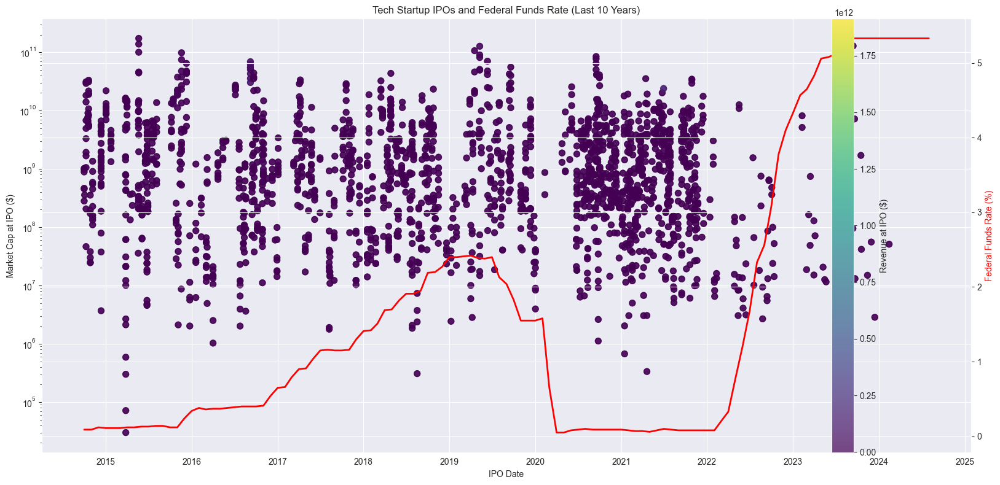

In [56]:
import os
from dotenv import load_dotenv
from fredapi import Fred
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Set the correct path
file_path = r'C:\Users\Katarina\OneDrive\Desktop\improved_cleaned_enhanced_data.csv'
df = pd.read_csv(file_path)

# Fetch Federal Funds Rate data
fred_client = Fred(api_key=os.getenv('FRED_API_KEY'))
ffr_data = fred_client.get_series('FEDFUNDS')

# Prepare the IPO data and filter for the last 10 years
df['firstpricedate'] = pd.to_datetime(df['firstpricedate'])
ten_years_ago = pd.Timestamp.now() - pd.DateOffset(years=10)
df_filtered = df[df['firstpricedate'] > ten_years_ago].sort_values('firstpricedate')

# Filter FFR data for the last 10 years
ffr_data_filtered = ffr_data[ffr_data.index > ten_years_ago]

# Create the plot
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot IPOs
scatter = ax1.scatter(df_filtered['firstpricedate'], df_filtered['marketcap'], 
                      alpha=0.7, c=df_filtered['revenue'], cmap='viridis', s=50)
ax1.set_ylabel('Market Cap at IPO ($)')
ax1.set_xlabel('IPO Date')
ax1.set_yscale('log')

# Plot Federal Funds Rate
ax2 = ax1.twinx()
ax2.plot(ffr_data_filtered.index, ffr_data_filtered.values, color='red', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', color='red')

plt.title('Tech Startup IPOs and Federal Funds Rate (Last 10 Years)')
plt.colorbar(scatter, label='Revenue at IPO ($)')
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

In [57]:
last_10_years_ffr = ffr_data_filtered.resample('YE').mean()

print("Federal Funds Rate (Annual Average) for the Last 10 Years:")
for year, rate in last_10_years_ffr.items():
    print(f"{year.year}: {rate:.2f}%")

Federal Funds Rate (Annual Average) for the Last 10 Years:
2014: 0.10%
2015: 0.13%
2016: 0.40%
2017: 1.00%
2018: 1.83%
2019: 2.16%
2020: 0.38%
2021: 0.08%
2022: 1.68%
2023: 5.02%
2024: 5.33%


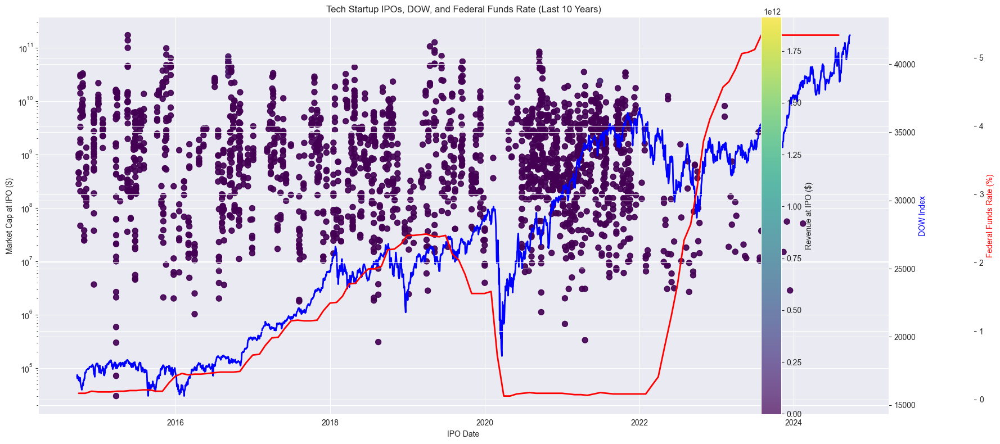

In [58]:
import yfinance as yf

# Fetch DOW data
dow = yf.Ticker("^DJI")
dow_data = dow.history(start=ten_years_ago)

# Create the plot
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot IPOs
scatter = ax1.scatter(df_filtered['firstpricedate'], df_filtered['marketcap'], 
                      alpha=0.7, c=df_filtered['revenue'], cmap='viridis', s=50)
ax1.set_ylabel('Market Cap at IPO ($)')
ax1.set_xlabel('IPO Date')
ax1.set_yscale('log')

# Plot DOW
ax2 = ax1.twinx()
ax2.plot(dow_data.index, dow_data['Close'], color='blue', linewidth=2)
ax2.set_ylabel('DOW Index', color='blue')

# Plot Federal Funds Rate
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('axes', 1.1))
ax3.plot(ffr_data_filtered.index, ffr_data_filtered.values, color='red', linewidth=2)
ax3.set_ylabel('Federal Funds Rate (%)', color='red')

plt.title('Tech Startup IPOs, DOW, and Federal Funds Rate (Last 10 Years)')
plt.colorbar(scatter, label='Revenue at IPO ($)')
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

In [62]:
print(df.columns)

Index(['ticker', 'name', 'sector', 'industry', 'scalemarketcap',
       'firstpricedate', 'lastpricedate', 'revenue', 'netinc', 'assets',
       'liabilities', 'equity', 'fcf', 'ebitda', 'marketcap', 'pe', 'pb',
       'date', 'eventcodes', 'date_first_day', 'lastupdated', 'ev', 'evebit',
       'evebitda', 'marketcap_first_day', 'pb_first_day', 'pe_first_day', 'ps',
       'date_first_action', 'action', 'value', 'year_after_date',
       'first_year_actions', 'revenue_missing', 'netinc_missing',
       'assets_missing', 'liabilities_missing', 'equity_missing',
       'fcf_missing', 'ebitda_missing', 'marketcap_missing', 'pe_missing',
       'pb_missing', 'event_missing', 'date_first_action_missing',
       'action_missing', 'value_missing', 'scalemarketcap_missing',
       'ps_missing'],
      dtype='object')


In [63]:
# Calculate the growth metric
df['growth_metric'] = df['marketcap'] / df['revenue']

# Define categories based on this growth metric
def categorize_growth(growth_metric):
    if growth_metric > 20:
        return 'High Growth'
    elif growth_metric > 10:
        return 'Moderate Growth'
    elif growth_metric > 5:
        return 'Slow Growth'
    else:
        return 'Value'

# Assign categories
df['growth_category'] = df['growth_metric'].apply(categorize_growth)

# Display category distribution
print(df['growth_category'].value_counts())

# Display some examples from each category
for category in df['growth_category'].unique():
    print(f"\n{category} companies:")
    print(df[df['growth_category'] == category][['ticker', 'name', 'growth_metric']].head())

growth_category
Value              4488
Slow Growth         774
High Growth         654
Moderate Growth     482
Name: count, dtype: int64

Value companies:
  ticker         name  growth_metric
0  ABILF  ABILITY INC       3.258574
1  ABILF  ABILITY INC       1.070290
3  ABILF  ABILITY INC       3.813157
4  ABILF  ABILITY INC       4.321814
5  ABILF  ABILITY INC       4.889375

Moderate Growth companies:
   ticker          name  growth_metric
2   ABILF   ABILITY INC      11.649139
9   ABILF   ABILITY INC      11.649139
58   AEYE  AUDIOEYE INC      11.401855
60   AEYE  AUDIOEYE INC      12.640777
68   AEYE  AUDIOEYE INC      11.401855

Slow Growth companies:
   ticker                       name  growth_metric
15   ABST     ABSOLUTE SOFTWARE CORP       5.934038
19   ABST     ABSOLUTE SOFTWARE CORP       5.934038
22   ACIA  ACACIA COMMUNICATIONS INC       5.270066
23   ACIA  ACACIA COMMUNICATIONS INC       6.022439
29   ACIA  ACACIA COMMUNICATIONS INC       5.270066

High Growth companies:


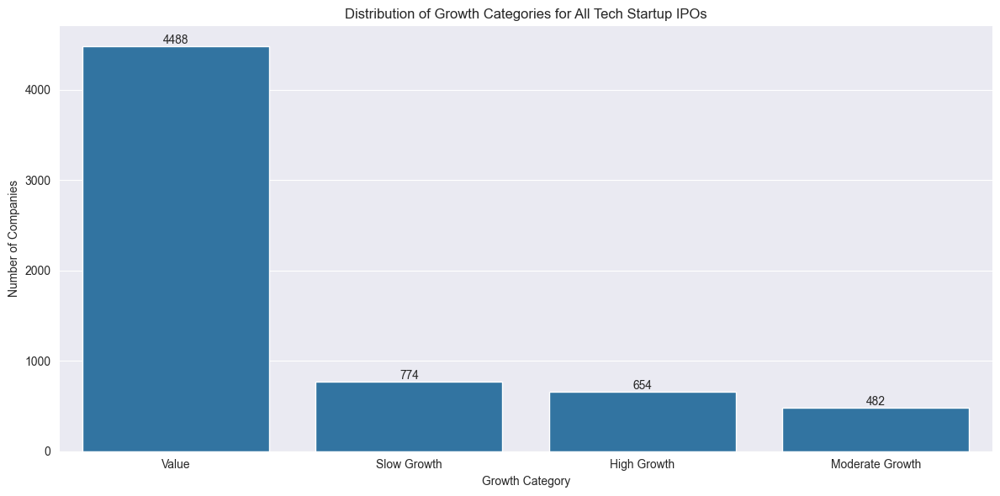

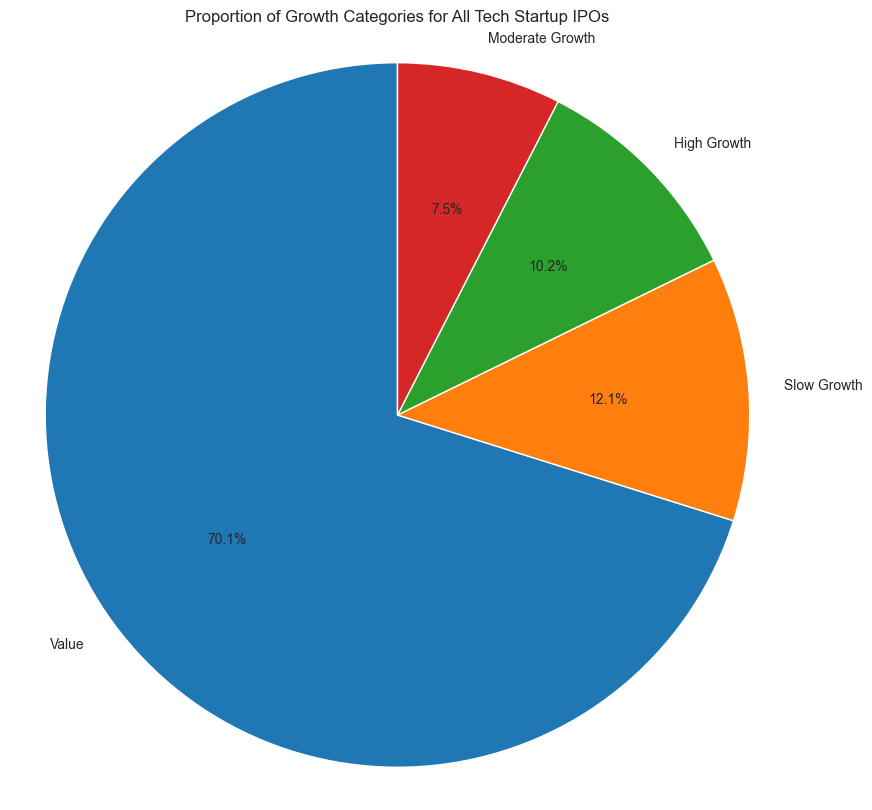

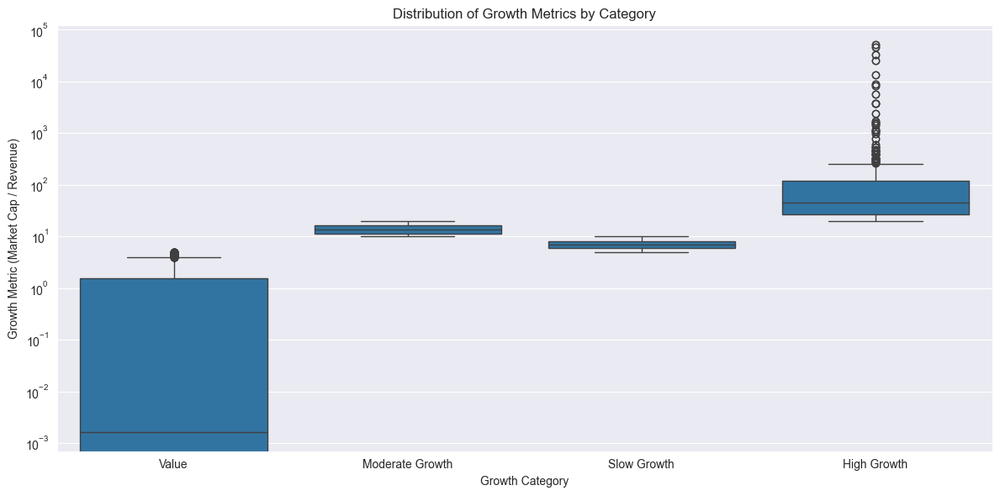

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for visualization
category_counts = df['growth_category'].value_counts()

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=category_counts.index, y=category_counts.values)
plt.title('Distribution of Growth Categories for All Tech Startup IPOs')
plt.xlabel('Growth Category')
plt.ylabel('Number of Companies')
for i, v in enumerate(category_counts):
    plt.text(i, v, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()

# Create a pie chart
plt.figure(figsize=(10, 10))
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Proportion of Growth Categories for All Tech Startup IPOs')
plt.axis('equal')
plt.show()

# Create a box plot to show distribution of growth metrics within each category
plt.figure(figsize=(12, 6))
sns.boxplot(x='growth_category', y='growth_metric', data=df)
plt.title('Distribution of Growth Metrics by Category')
plt.xlabel('Growth Category')
plt.ylabel('Growth Metric (Market Cap / Revenue)')
plt.yscale('log')
plt.tight_layout()
plt.show()

In [65]:
value_companies = df[df['growth_category'] == 'Value']

In [66]:
value_stats = value_companies['growth_metric'].describe()
print("Statistics for 'Value' category:")
print(value_stats)

Statistics for 'Value' category:
count    4386.000000
mean        0.951606
std         1.387169
min        -0.529435
25%         0.000000
50%         0.001655
75%         1.576310
max         4.996216
Name: growth_metric, dtype: float64


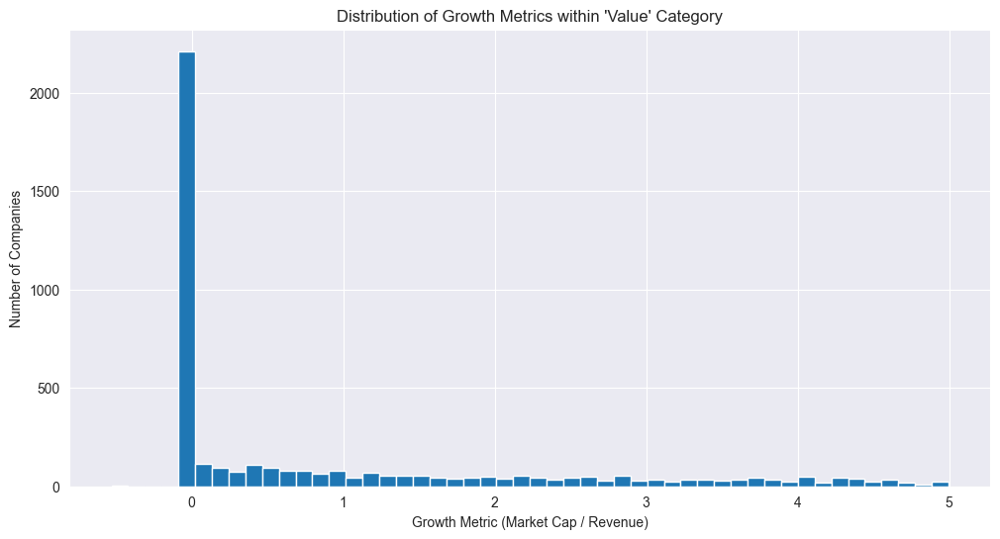

In [67]:
plt.figure(figsize=(12, 6))
plt.hist(value_companies['growth_metric'], bins=50)
plt.title("Distribution of Growth Metrics within 'Value' Category")
plt.xlabel("Growth Metric (Market Cap / Revenue)")
plt.ylabel("Number of Companies")
plt.show()

In [68]:
top_value_companies = value_companies.sort_values('marketcap', ascending=False).head(10)
print("\nTop 10 'Value' companies by market cap:")
print(top_value_companies[['ticker', 'name', 'marketcap', 'revenue', 'growth_metric']])


Top 10 'Value' companies by market cap:
     ticker                   name     marketcap       revenue  growth_metric
5713   UBER  UBER TECHNOLOGIES INC  1.267023e+11  3.728100e+10       3.398577
5721   UBER  UBER TECHNOLOGIES INC  1.267023e+11  3.728100e+10       3.398577
5711   UBER  UBER TECHNOLOGIES INC  8.134916e+10  1.745500e+10       4.660507
5719   UBER  UBER TECHNOLOGIES INC  8.134916e+10  1.745500e+10       4.660507
5283     SQ              BLOCK INC  7.450063e+10  1.766120e+10       4.218321
5273     SQ              BLOCK INC  7.450063e+10  1.766120e+10       4.218321
1747   DELL  DELL TECHNOLOGIES INC  6.892062e+10  9.062100e+10       0.760537
1737   DELL  DELL TECHNOLOGIES INC  6.892062e+10  9.062100e+10       0.760537
1742   DELL  DELL TECHNOLOGIES INC  6.142541e+10  8.842500e+10       0.694661
1732   DELL  DELL TECHNOLOGIES INC  6.142541e+10  8.842500e+10       0.694661


In [71]:
from datetime import datetime, timedelta

# Convert 'date_first_day' to datetime
df['date_first_day'] = pd.to_datetime(df['date_first_day'])

# Filter for IPOs in the last 10 years
ten_years_ago = datetime.now() - timedelta(days=3650)
recent_ipos = df[df['date_first_day'] > ten_years_ago]

# Calculate returns
recent_ipos['return'] = (recent_ipos['marketcap'] - recent_ipos['marketcap_first_day']) / recent_ipos['marketcap_first_day']

# Summary statistics
performance_summary = recent_ipos['return'].describe()
print("Performance Summary of Tech IPOs in the Last 10 Years:")
print(performance_summary)

# Top performers
top_performers = recent_ipos.sort_values('return', ascending=False).head(10)
print("\nTop 10 Performing IPOs:")
print(top_performers[['ticker', 'name', 'date_first_day', 'return']])

# Worst performers
worst_performers = recent_ipos.sort_values('return', ascending=True).head(10)
print("\nWorst 10 Performing IPOs:")
print(worst_performers[['ticker', 'name', 'date_first_day', 'return']])

Performance Summary of Tech IPOs in the Last 10 Years:
count    6.398000e+03
mean     2.332751e+06
std      1.893356e+07
min     -1.000000e+00
25%     -1.000000e+00
50%      4.732893e+05
75%      1.292484e+06
max      6.206925e+08
Name: return, dtype: float64

Top 10 Performing IPOs:
     ticker       name date_first_day        return
4581   QRVO  QORVO INC     2015-01-02  6.206925e+08
4592   QRVO  QORVO INC     2015-01-02  6.206925e+08
4593   QRVO  QORVO INC     2015-01-02  3.743047e+08
4582   QRVO  QORVO INC     2015-01-02  3.743047e+08
4575   QRVO  QORVO INC     2015-01-02  3.343920e+08
4586   QRVO  QORVO INC     2015-01-02  3.343920e+08
4595   QRVO  QORVO INC     2015-01-02  3.149619e+08
4584   QRVO  QORVO INC     2015-01-02  3.149619e+08
4583   QRVO  QORVO INC     2015-01-02  2.882314e+08
4594   QRVO  QORVO INC     2015-01-02  2.882314e+08

Worst 10 Performing IPOs:
     ticker                      name date_first_day  return
6397    ZUO                 ZUORA INC     2018-04-12   

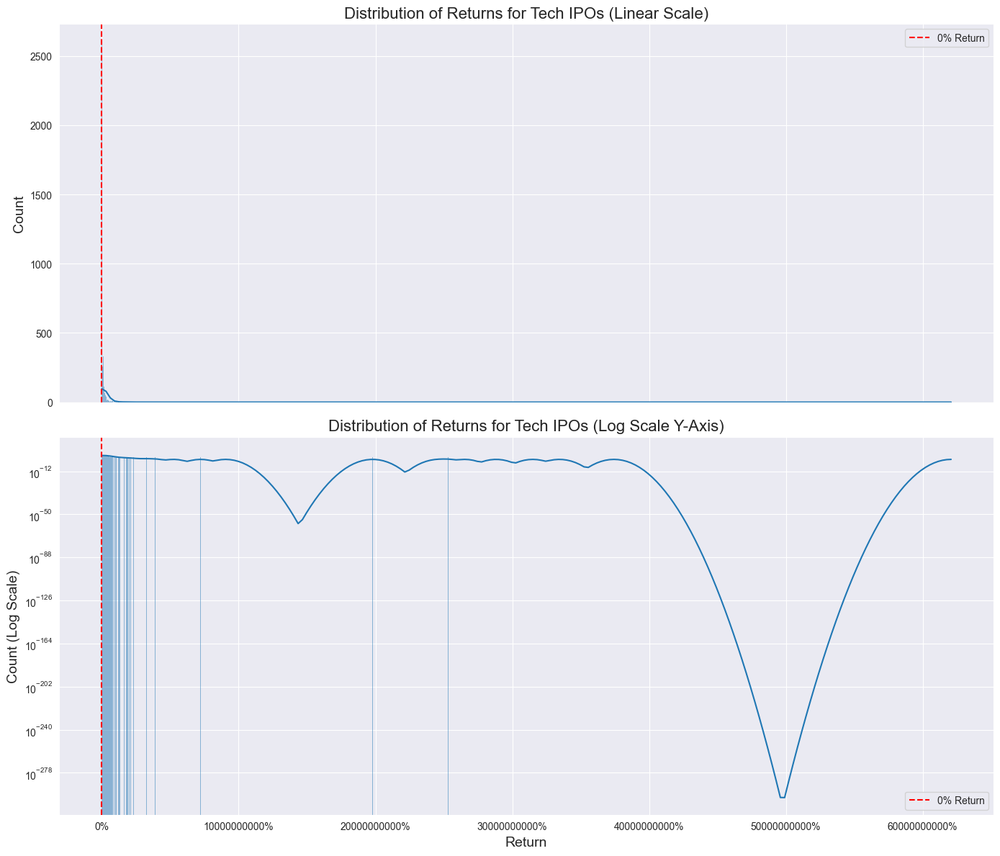

In [75]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 12), sharex=True)

# Linear scale plot
sns.histplot(recent_ipos['return'], kde=True, ax=ax1)
ax1.set_title('Distribution of Returns for Tech IPOs (Linear Scale)', fontsize=16)
ax1.set_ylabel('Count', fontsize=14)
ax1.axvline(x=0, color='r', linestyle='--', label='0% Return')

# Log scale plot
sns.histplot(recent_ipos['return'], kde=True, ax=ax2)
ax2.set_yscale('log')
ax2.set_title('Distribution of Returns for Tech IPOs (Log Scale Y-Axis)', fontsize=16)
ax2.set_xlabel('Return', fontsize=14)
ax2.set_ylabel('Count (Log Scale)', fontsize=14)
ax2.axvline(x=0, color='r', linestyle='--', label='0% Return')

# Set x-axis to percentage format for both plots
for ax in [ax1, ax2]:
    ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.0%}'))
    ax.legend()

plt.tight_layout()
plt.show()

In [79]:
# Group by ticker and select the most recent entry for each company
latest_data = recent_ipos.sort_values('lastpricedate').groupby('ticker').last().reset_index()

# Recalculate returns based on the most recent data
latest_data['return'] = (latest_data['marketcap'] - latest_data['marketcap_first_day']) / latest_data['marketcap_first_day']

# Get the top performers based on the refined data
top_performers = latest_data.sort_values('return', ascending=False).head(10)

print("Top 10 Performing IPOs (Refined):")
print(top_performers[['ticker', 'name', 'date_first_day', 'lastpricedate', 'return', 'sector', 'industry']])

# Display detailed information for each top performer
for index, company in top_performers.iterrows():
    print(f"\nCompany: {company['name']} ({company['ticker']})")
    print(f"Sector: {company['sector']}")
    print(f"Industry: {company['industry']}")
    print(f"IPO Date: {company['date_first_day']}")
    print(f"Last Price Date: {company['lastpricedate']}")
    print(f"Return: {company['return']:.2%}")
    print(f"Market Cap: ${company['marketcap']:,.0f}")
    print(f"Revenue: ${company['revenue']:,.0f}")
    print(f"Net Income: ${company['netinc']:,.0f}")

Top 10 Performing IPOs (Refined):
    ticker                        name date_first_day lastpricedate  \
390   QRVO                   QORVO INC     2015-01-02    2024-09-20   
204   GRAB           GRAB HOLDINGS LTD     2020-10-01    2024-09-20   
427   SHOP                 SHOPIFY INC     2015-05-21    2024-09-20   
418   SEDG  SOLAREDGE TECHNOLOGIES INC     2015-03-31    2024-09-20   
288    MDB                 MONGODB INC     2017-10-19    2024-09-20   
85    BTDR  BITDEER TECHNOLOGIES GROUP     2021-06-10    2024-09-20   
76    BMTM   BRIGHT MOUNTAIN MEDIA INC     2014-10-27    2021-11-30   
3     ACMR            ACM RESEARCH INC     2017-11-03    2024-09-20   
150     DM           DESKTOP METAL INC     2019-03-15    2024-09-20   
59     AYX                 ALTERYX INC     2017-03-24    2024-03-18   

           return      sector                             industry  
390  2.882314e+08  Technology                       Semiconductors  
204  3.903127e+07  Technology               So

In [80]:
# Calculate additional metrics
top_performers['profit_margin'] = top_performers['netinc'] / top_performers['revenue']
top_performers['revenue_per_market_cap'] = top_performers['revenue'] / top_performers['marketcap']

# Display summary of business model characteristics
print("\nSummary of Top Performers' Business Models:")
print(top_performers[['sector', 'industry', 'profit_margin', 'revenue_per_market_cap']].describe())

# Count of top performers by sector and industry
sector_counts = top_performers['sector'].value_counts()
industry_counts = top_performers['industry'].value_counts()

print("\nTop Performers by Sector:")
print(sector_counts)

print("\nTop Performers by Industry:")
print(industry_counts)

# Analyze common characteristics
print("\nCommon Characteristics of Top Performers:")
high_growth = top_performers[top_performers['return'] > 5]  # Over 500% return
high_profit = top_performers[top_performers['profit_margin'] > 0.2]  # Over 20% profit margin

print(f"Number of companies with over 500% return: {len(high_growth)}")
print(f"Number of companies with over 20% profit margin: {len(high_profit)}")

# Identify any overlapping high-growth and high-profit companies
overlap = set(high_growth.index) & set(high_profit.index)
print(f"Number of companies with both high growth and high profit: {len(overlap)}")


Summary of Top Performers' Business Models:
       profit_margin  revenue_per_market_cap
count      10.000000               10.000000
mean       -1.188885                0.147592
std         2.038151                0.169797
min        -5.109630                0.004224
25%        -1.587384                0.036997
50%        -0.092018                0.059649
75%         0.009372                0.274237
max         0.138687                0.470940

Top Performers by Sector:
sector
Technology    10
Name: count, dtype: int64

Top Performers by Industry:
industry
Software - Application                 5
Semiconductors                         1
Solar                                  1
Software - Infrastructure              1
Semiconductor Equipment & Materials    1
Computer Hardware                      1
Name: count, dtype: int64

Common Characteristics of Top Performers:
Number of companies with over 500% return: 10
Number of companies with over 20% profit margin: 0
Number of companies wit

Top Sectors for High-Growth Tech Startups:
sector
Technology    4106
Name: count, dtype: int64

Top Industries for High-Growth Tech Startups:
industry
Software - Application                 1744
Software - Infrastructure              1030
Communication Equipment                 252
Information Technology Services         240
Semiconductors                          196
Computer Hardware                       172
Solar                                   166
Scientific & Technical Instruments      118
Electronic Components                    72
Semiconductor Equipment & Materials      62
Name: count, dtype: int64


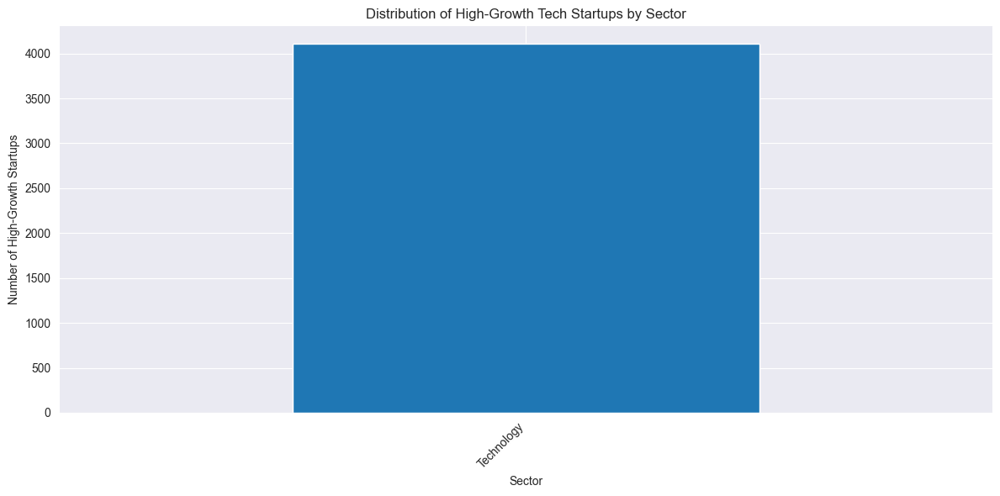


Percentage of High-Growth Startups by Sector:
Technology: 100.00%


In [82]:
df['return'] = (df['marketcap'] - df['marketcap_first_day']) / df['marketcap_first_day']

# Define high-growth startups
high_growth_threshold = 1.0  # 100% return
high_growth_startups = df[df['return'] > high_growth_threshold]

# Analyze industry sectors
sector_counts = high_growth_startups['sector'].value_counts()
industry_counts = high_growth_startups['industry'].value_counts()

print("Top Sectors for High-Growth Tech Startups:")
print(sector_counts)

print("\nTop Industries for High-Growth Tech Startups:")
print(industry_counts.head(10))  # Show top 10 industries

# Visualize sector distribution
plt.figure(figsize=(12, 6))
sector_counts.plot(kind='bar')
plt.title('Distribution of High-Growth Tech Startups by Sector')
plt.xlabel('Sector')
plt.ylabel('Number of High-Growth Startups')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Calculate percentage of high-growth startups in each sector
sector_percentages = (sector_counts / len(high_growth_startups)) * 100

print("\nPercentage of High-Growth Startups by Sector:")
for sector, percentage in sector_percentages.items():
    print(f"{sector}: {percentage:.2f}%")

In [84]:
total_startups = df['ticker'].nunique()
print(f"Total number of startups in the dataset: {total_startups}")


Total number of startups in the dataset: 545


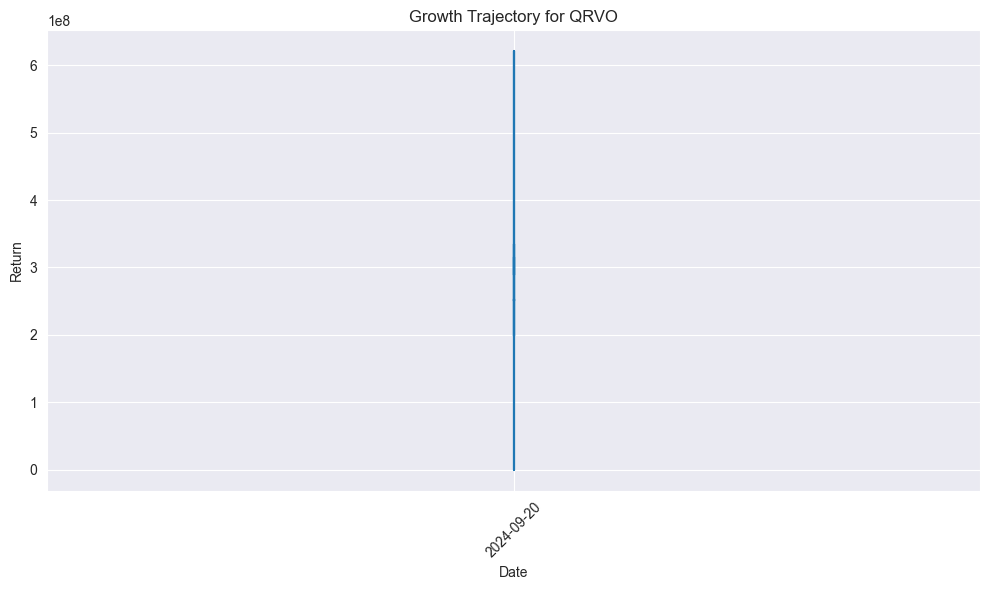

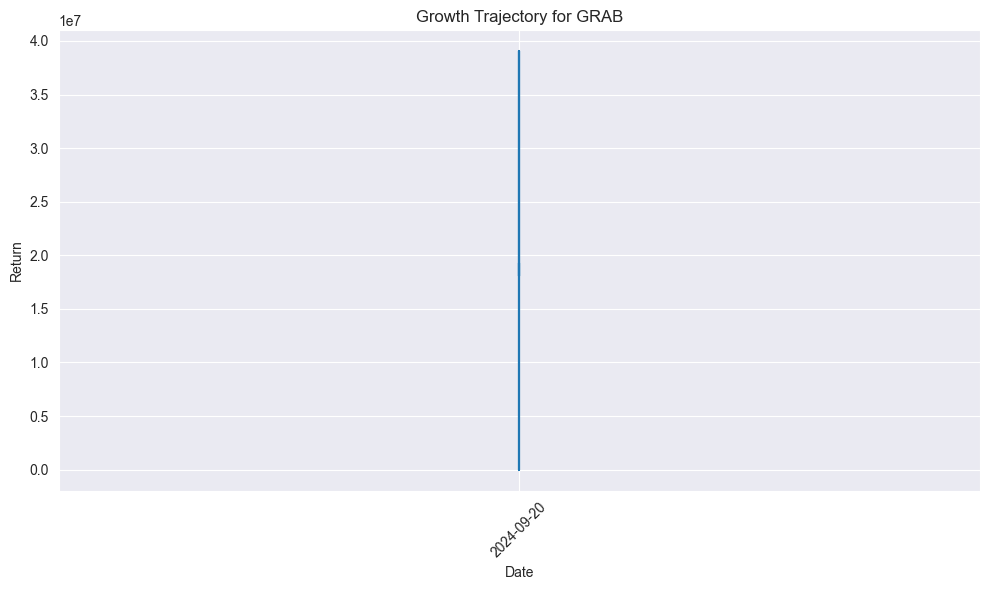

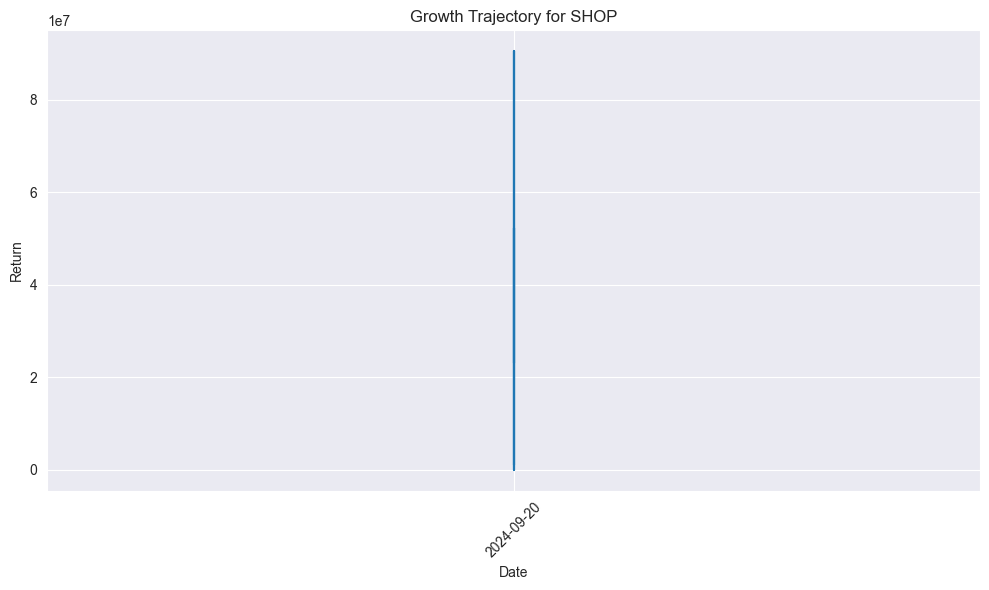

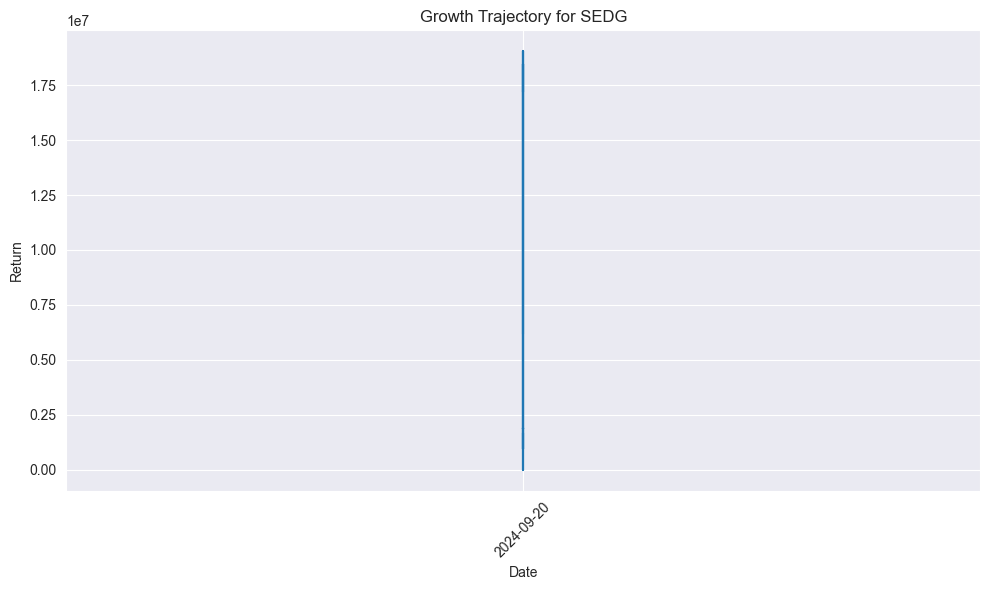

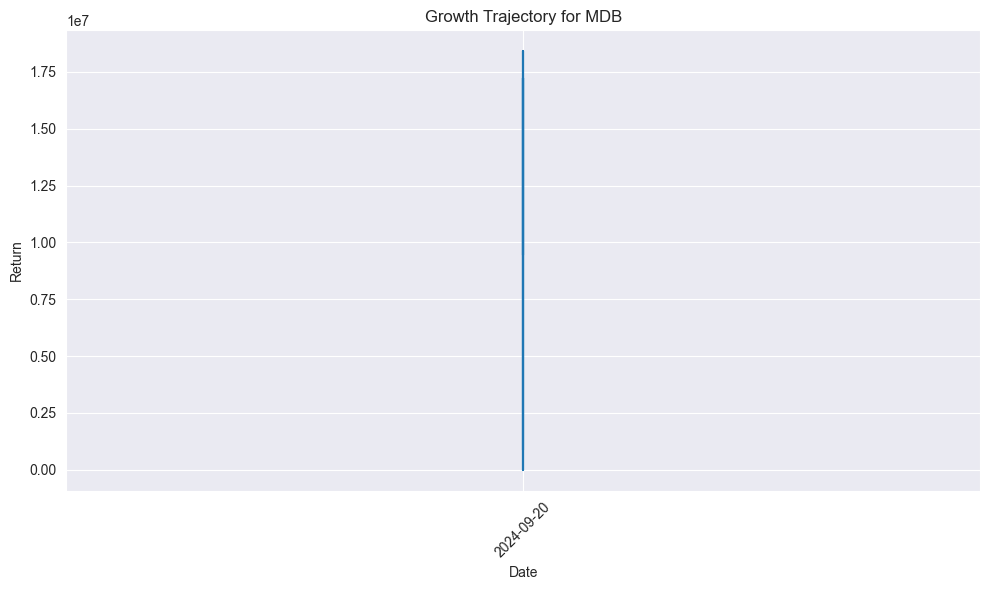

Top 10 startups by high-growth category appearances:
ticker
HUBS    20
QRVO    20
UPLD    20
KEYS    20
WK      20
BOX     20
RMNI    18
GDDY    18
LITE    18
NXPL    18
Name: high_growth, dtype: int64

Top 10 startups by percentage of time in high-growth category:
ticker
MSAI     100.0
BKSY     100.0
WK       100.0
CAUD     100.0
MOLGY    100.0
VSLR     100.0
MRDB     100.0
FAAS     100.0
BMTX     100.0
NOTE     100.0
dtype: float64


In [85]:
# Focus on the most recent entry for each startup
latest_data = df.sort_values('lastpricedate').groupby('ticker').last().reset_index()

# Calculate return for the latest data
latest_data['return'] = (latest_data['marketcap'] - latest_data['marketcap_first_day']) / latest_data['marketcap_first_day']

# Analyze growth trajectories over time
def analyze_growth_trajectory(ticker):
    company_data = df[df['ticker'] == ticker].sort_values('lastpricedate')
    company_data['return'] = (company_data['marketcap'] - company_data['marketcap_first_day']) / company_data['marketcap_first_day']
    plt.figure(figsize=(10, 6))
    plt.plot(company_data['lastpricedate'], company_data['return'])
    plt.title(f'Growth Trajectory for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Return')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Analyze top 5 performers
top_performers = latest_data.nlargest(5, 'return')
for ticker in top_performers['ticker']:
    analyze_growth_trajectory(ticker)

# Investigate high-growth category appearances
high_growth_threshold = 1.0  # 100% return
df['high_growth'] = df['return'] > high_growth_threshold
high_growth_appearances = df.groupby('ticker')['high_growth'].sum().sort_values(ascending=False)

print("Top 10 startups by high-growth category appearances:")
print(high_growth_appearances.head(10))

# Calculate percentage of time in high-growth category
total_appearances = df.groupby('ticker').size()
high_growth_percentage = (high_growth_appearances / total_appearances * 100).sort_values(ascending=False)

print("\nTop 10 startups by percentage of time in high-growth category:")
print(high_growth_percentage.head(10))

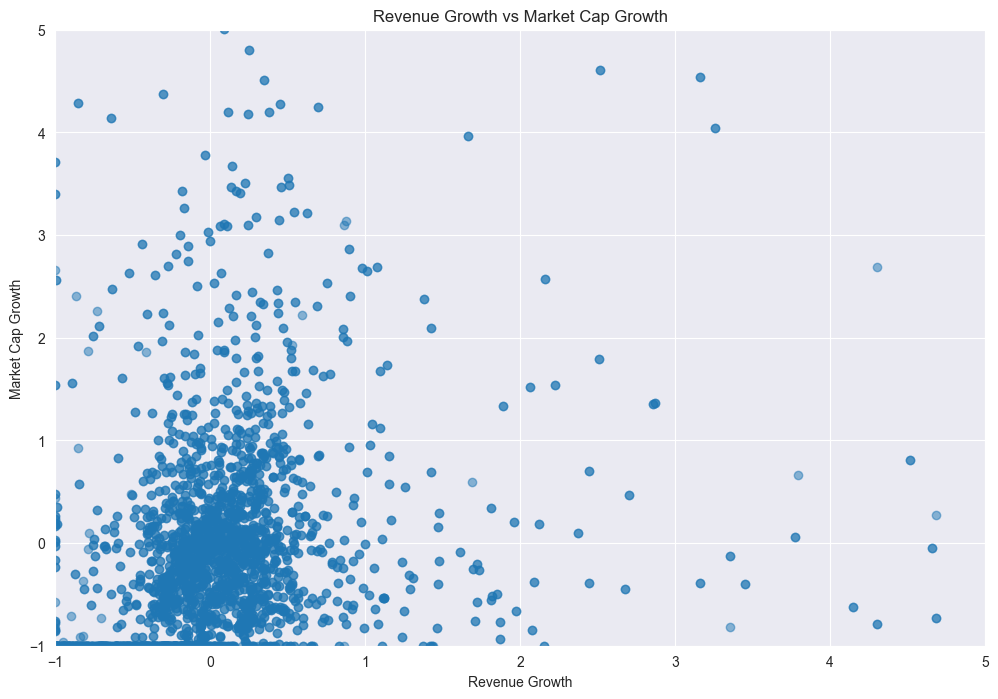

In [88]:
plt.figure(figsize=(12, 8))
plt.scatter(df['revenue_growth'], df['marketcap_growth'], alpha=0.5)
plt.xlabel('Revenue Growth')
plt.ylabel('Market Cap Growth')
plt.title('Revenue Growth vs Market Cap Growth')
plt.xlim(-1, 5)  # Adjust limits as needed
plt.ylim(-1, 5)  # Adjust limits as needed
plt.show()

Correlation between market cap growth and pe: nan
Correlation between market cap growth and pb: nan
Correlation between market cap growth and ps: nan
Correlation between market cap growth and evebitda: nan
Correlation between market cap growth and netinc: nan
Correlation between market cap growth and fcf: nan
Correlation between market cap growth and ebitda: nan


C:\Users\Katarina\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


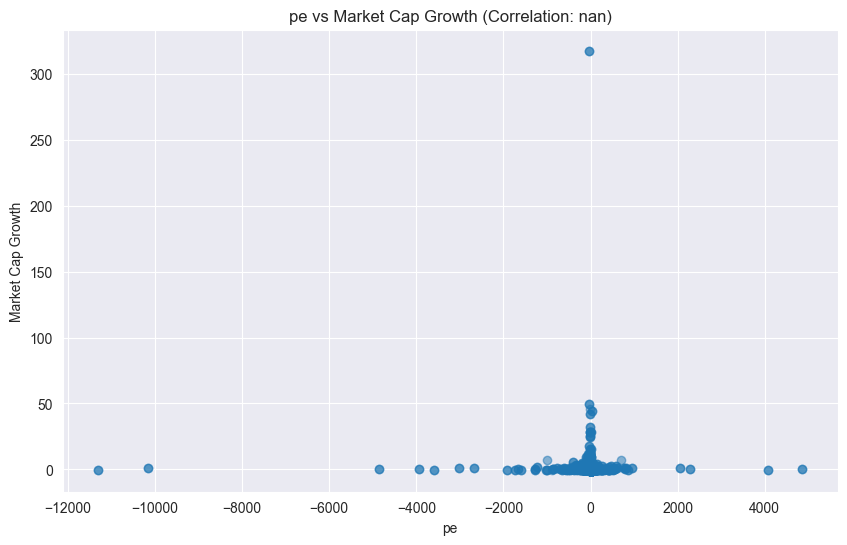

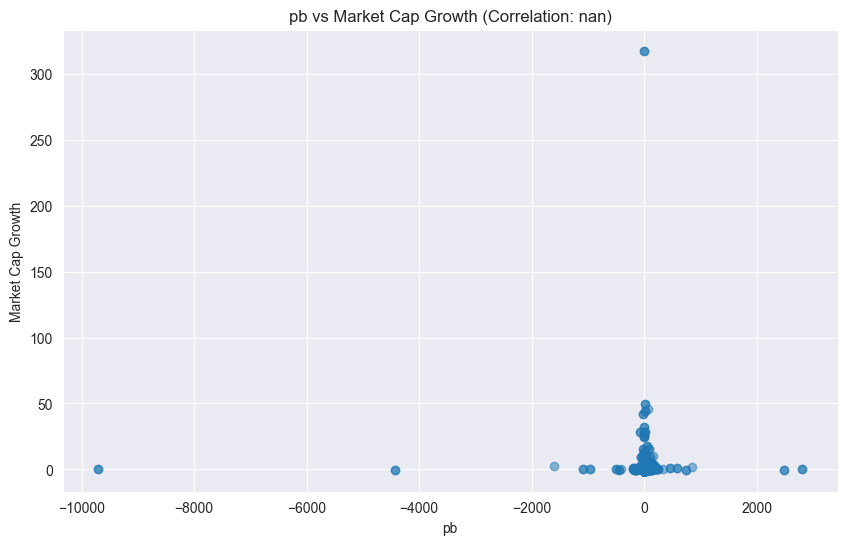

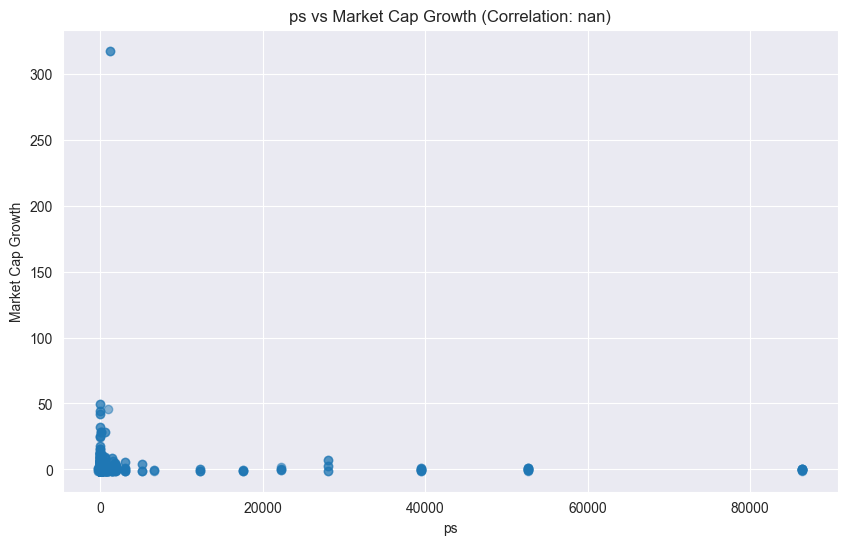

In [89]:
financial_metrics = ['pe', 'pb', 'ps', 'evebitda', 'netinc', 'fcf', 'ebitda']

for metric in financial_metrics:
    correlation = df['marketcap_growth'].corr(df[metric])
    print(f"Correlation between market cap growth and {metric}: {correlation}")

# Visualize the strongest correlations
top_metrics = sorted([(metric, df['marketcap_growth'].corr(df[metric])) 
                      for metric in financial_metrics], 
                     key=lambda x: abs(x[1]), reverse=True)[:3]

for metric, corr in top_metrics:
    plt.figure(figsize=(10, 6))
    plt.scatter(df[metric], df['marketcap_growth'], alpha=0.5)
    plt.xlabel(metric)
    plt.ylabel('Market Cap Growth')
    plt.title(f'{metric} vs Market Cap Growth (Correlation: {corr:.2f})')
    plt.show()

In [94]:
print(df_clean.info())
print(df_clean.describe())

<class 'pandas.core.frame.DataFrame'>
Index: 698 entries, 6 to 6396
Data columns (total 64 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   ticker                     698 non-null    object        
 1   name                       698 non-null    object        
 2   sector                     698 non-null    object        
 3   industry                   698 non-null    object        
 4   scalemarketcap             698 non-null    object        
 5   firstpricedate             698 non-null    datetime64[ns]
 6   lastpricedate              698 non-null    object        
 7   revenue                    698 non-null    float64       
 8   netinc                     698 non-null    float64       
 9   assets                     698 non-null    float64       
 10  liabilities                698 non-null    float64       
 11  equity                     698 non-null    float64       
 12  fcf         

C:\Users\Katarina\AppData\Local\Programs\Python\Python312\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


In [96]:
for column in df.columns:
    if 'ABILF' in df[column].values:
        print(f"'ABILF' found in column: {column}")

'ABILF' found in column: ticker


In [97]:
numeric_columns = df.select_dtypes(include=[np.number]).columns.tolist()

In [98]:
correlation_matrix = df[numeric_columns].corr(method='pearson', min_periods=1)

In [102]:
def signed_log(x):
    return np.sign(x) * np.log1p(np.abs(x))

for metric in ['netinc', 'fcf']:
    df[f'{metric}_log'] = signed_log(df[metric])

In [104]:
epsilon = 1e-8
for metric in ['revenue', 'assets', 'liabilities', 'equity', 'ebitda', 'marketcap']:
    df[f'{metric}_log'] = np.log1p(df[metric].clip(lower=0) + epsilon)
    
for metric in ['pe', 'pb', 'ps', 'evebitda']:
    df[f'{metric}_log'] = np.log1p(df[metric].clip(lower=epsilon))

In [105]:
correlation_matrix = df[['marketcap_growth'] + [f'{metric}_log' for metric in financial_metrics]].corr()
print(correlation_matrix['marketcap_growth'].sort_values(ascending=False))

marketcap_growth    1.000000
marketcap_log       0.090922
ps_log              0.065181
pb_log              0.057302
pe_log             -0.003909
netinc_log         -0.027450
evebitda_log       -0.034542
ebitda_log         -0.036978
fcf_log            -0.041427
revenue_log        -0.052129
Name: marketcap_growth, dtype: float64


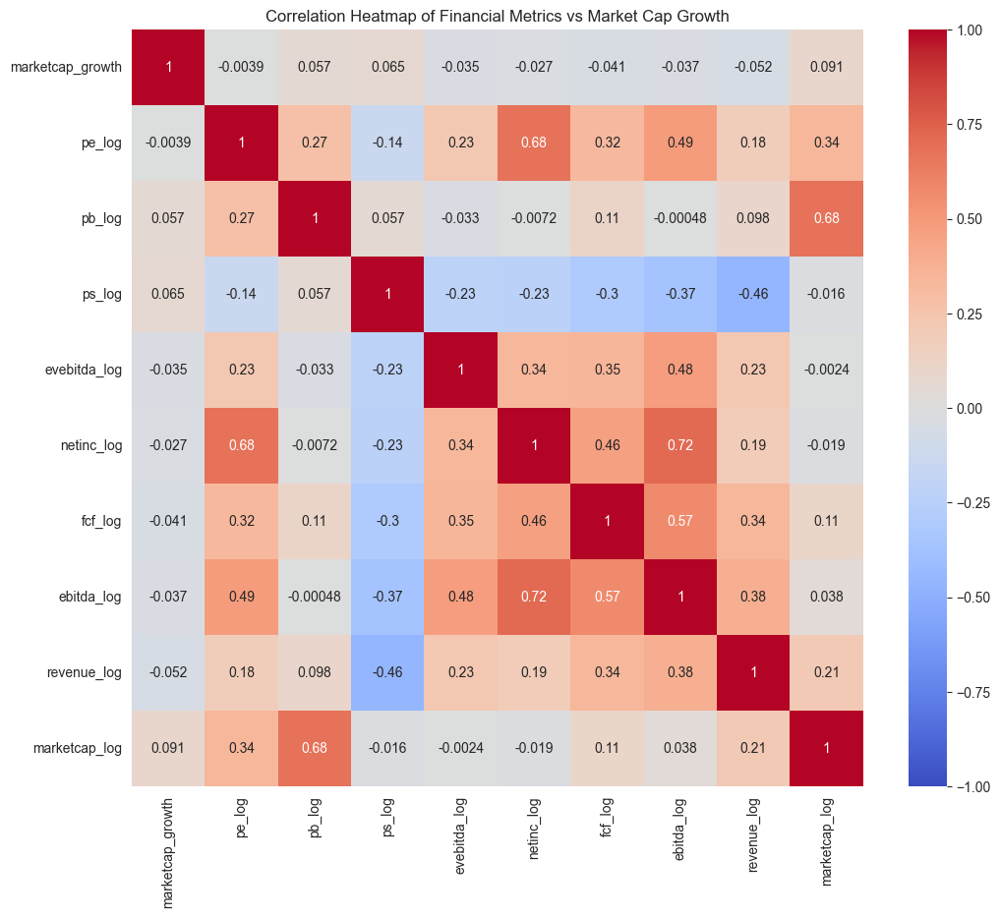

In [106]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation Heatmap of Financial Metrics vs Market Cap Growth')
plt.show()

In [107]:
for size in df['scalemarketcap'].unique():
    segment = df[df['scalemarketcap'] == size]
    print(f"\nCorrelations for {size} companies:")
    print(segment[['marketcap_growth'] + [f'{metric}_log' for metric in financial_metrics]].corr()['marketcap_growth'].sort_values(ascending=False))


Correlations for 2 - Micro companies:
marketcap_growth    1.000000
pb_log              0.310399
marketcap_log       0.243769
ps_log              0.049976
pe_log              0.031941
revenue_log        -0.019747
fcf_log            -0.032864
netinc_log         -0.059718
ebitda_log         -0.062420
evebitda_log       -0.071951
Name: marketcap_growth, dtype: float64

Correlations for 3 - Small companies:
marketcap_growth    1.000000
marketcap_log       0.219013
pb_log              0.121660
pe_log              0.031613
ps_log              0.021843
evebitda_log       -0.004337
netinc_log         -0.038674
ebitda_log         -0.041794
revenue_log        -0.048094
fcf_log            -0.060718
Name: marketcap_growth, dtype: float64

Correlations for 4 - Mid companies:
marketcap_growth    1.000000
ps_log              0.143049
marketcap_log       0.064361
pb_log              0.031099
pe_log             -0.019354
netinc_log         -0.035385
evebitda_log       -0.052495
ebitda_log         -0.05

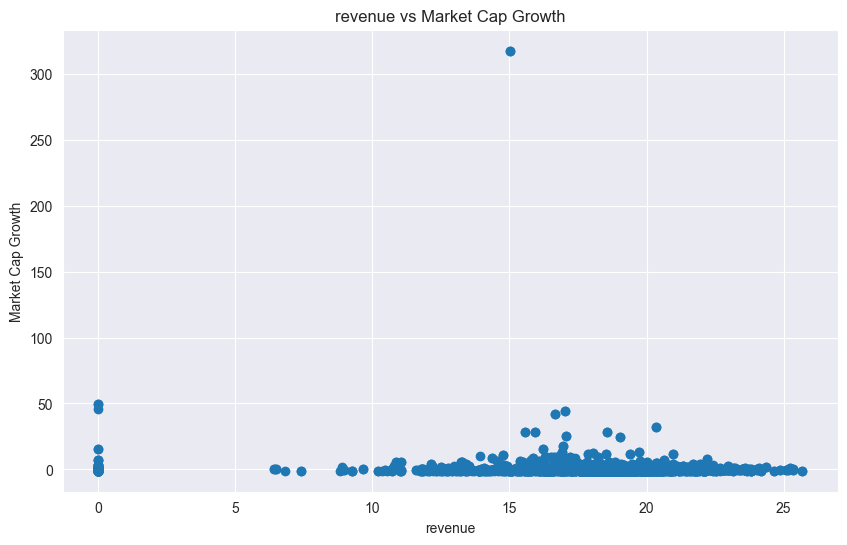

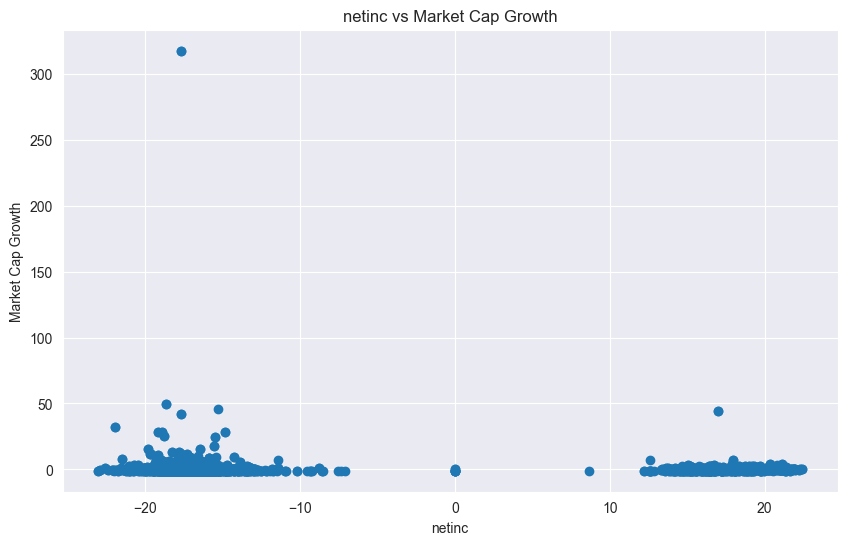

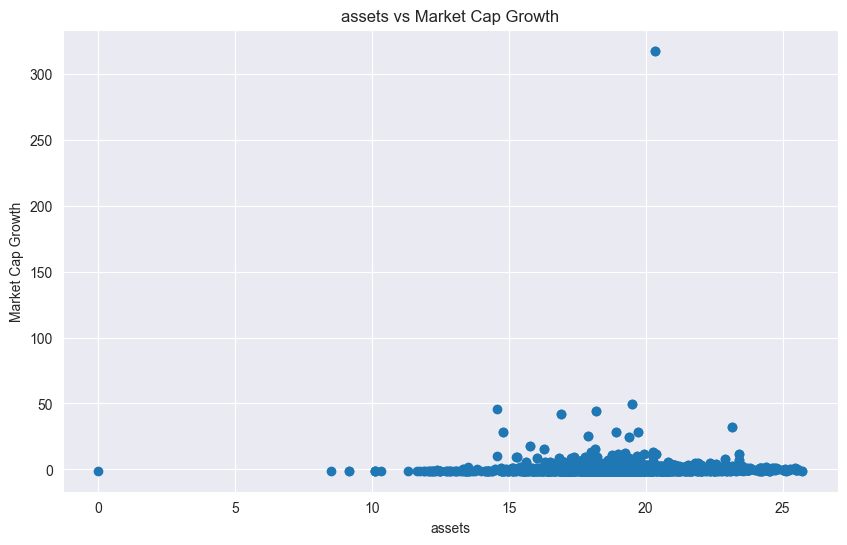

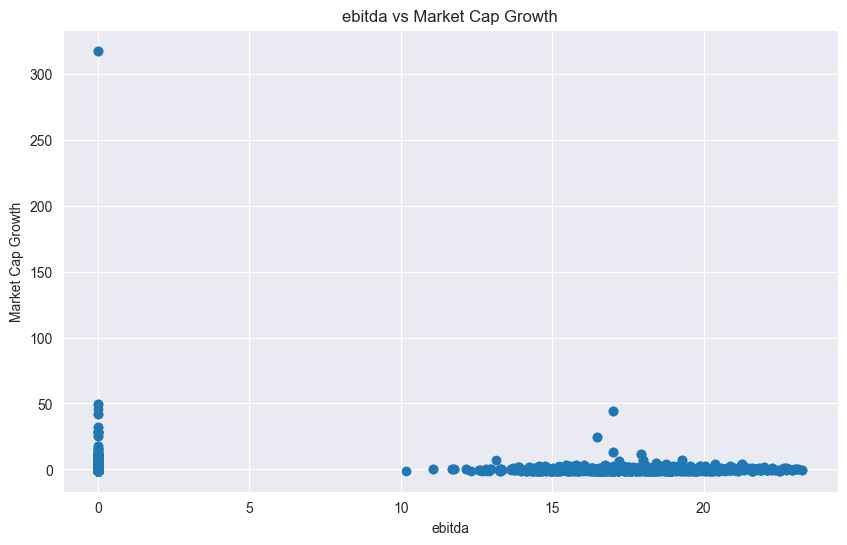

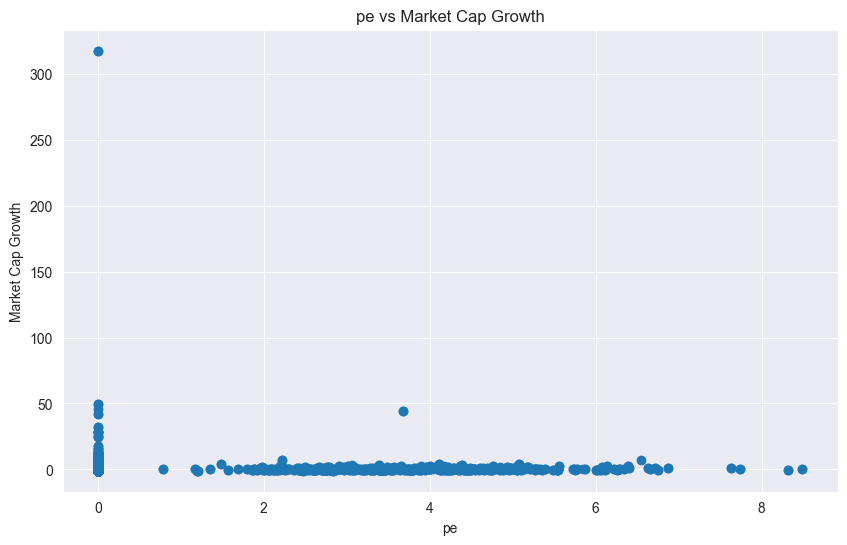

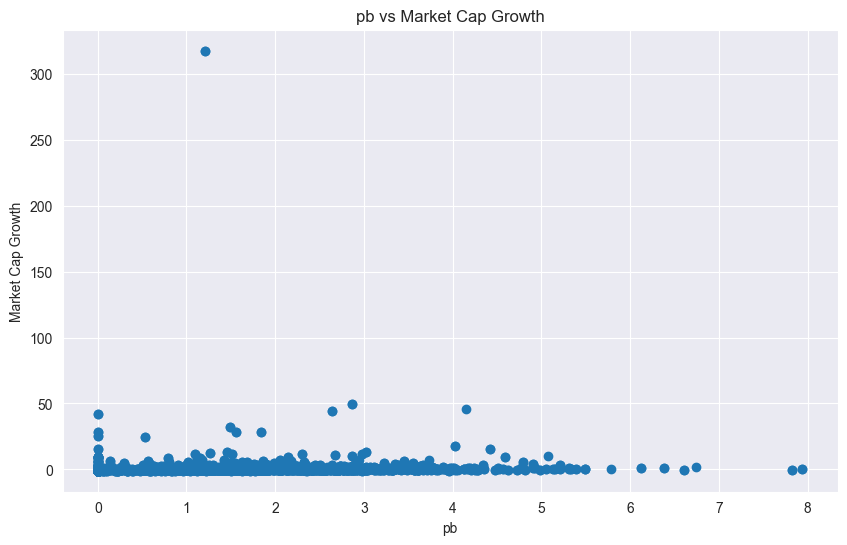

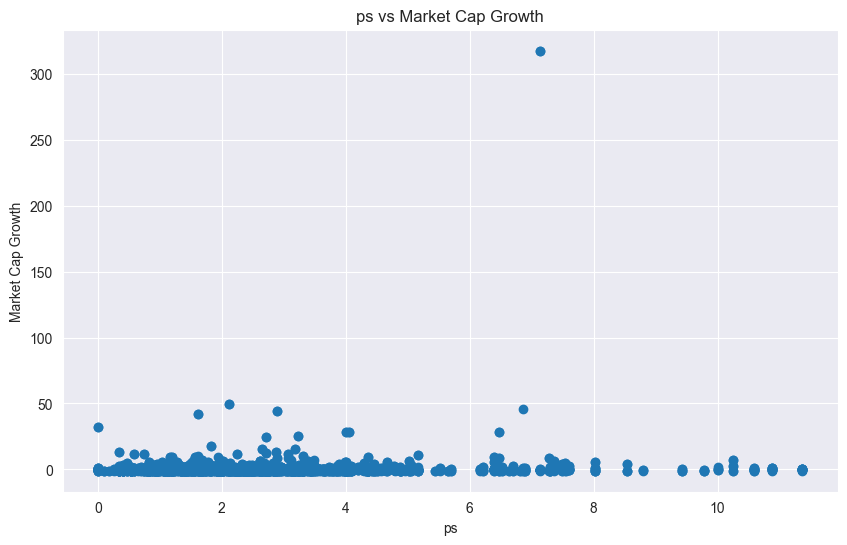

In [109]:
relevant_metrics = ['revenue_log', 'netinc_log', 'assets_log', 'ebitda_log', 'pe_log', 'pb_log', 'ps_log']

for metric in relevant_metrics:
    plt.figure(figsize=(10, 6))
    plt.scatter(df[metric], df['marketcap_growth'])
    plt.xlabel(metric.replace('_log', ''))
    plt.ylabel('Market Cap Growth')
    plt.title(f'{metric.replace("_log", "")} vs Market Cap Growth')
    plt.show()

In [110]:
top_companies = df.sort_values('marketcap_growth', ascending=False).head(10)

In [112]:
print("Top 10 Tech Startup IPOs by Market Cap Growth:")
for _, company in top_companies.iterrows():
    print(f"{company['name']} ({company['ticker']}):")
    print(f"  IPO Date: {company['date_first_day']}")
    print(f"  Last Price Date: {company['lastpricedate']}")
    print(f"  Market Cap Growth: {company['marketcap_growth']:.2f}")
    print(f"  Time Since IPO: {(pd.to_datetime(company['lastpricedate']) - company['date_first_day']).days} days")

Top 10 Tech Startup IPOs by Market Cap Growth:
CS DISCO INC (LAW):
  IPO Date: 2021-07-21 00:00:00
  Last Price Date: 2024-09-20
  Market Cap Growth: inf
  Time Since IPO: 1157 days
INSTRUCTURE HOLDINGS INC (INST):
  IPO Date: 2021-07-22 00:00:00
  Last Price Date: 2024-09-20
  Market Cap Growth: inf
  Time Since IPO: 1156 days
BEAMR IMAGING LTD (BMR):
  IPO Date: 2023-02-28 00:00:00
  Last Price Date: 2024-09-20
  Market Cap Growth: inf
  Time Since IPO: 570 days
BEAMR IMAGING LTD (BMR):
  IPO Date: 2023-02-28 00:00:00
  Last Price Date: 2024-09-20
  Market Cap Growth: inf
  Time Since IPO: 570 days
BRIGHT MOUNTAIN MEDIA INC (BMTM):
  IPO Date: 2014-10-27 00:00:00
  Last Price Date: 2021-11-30
  Market Cap Growth: inf
  Time Since IPO: 2591 days
ADESTO TECHNOLOGIES CORP (IOTS):
  IPO Date: 2015-10-27 00:00:00
  Last Price Date: 2020-06-26
  Market Cap Growth: inf
  Time Since IPO: 1704 days
ATLASSIAN CORP (TEAM):
  IPO Date: 2015-12-09 00:00:00
  Last Price Date: 2024-09-20
  Market C

In [121]:
from tabulate import tabulate

# Sort companies by marketcap_growth
top_companies_sorted = top_companies.sort_values('marketcap_growth', ascending=False)

# Prepare data for tabulate
table_data = top_companies_sorted[['ticker', 'name', 'marketcap_growth', 'date_first_day']].values.tolist()
print(tabulate(table_data, headers=['Ticker', 'Name', 'Market Cap Growth', 'IPO Date'], tablefmt='grid'))

+----------+---------------------------+---------------------+---------------------+
| Ticker   | Name                      |   Market Cap Growth | IPO Date            |
+==========+===========================+=====================+=====================+
| LAW      | CS DISCO INC              |                 inf | 2021-07-21 00:00:00 |
+----------+---------------------------+---------------------+---------------------+
| INST     | INSTRUCTURE HOLDINGS INC  |                 inf | 2021-07-22 00:00:00 |
+----------+---------------------------+---------------------+---------------------+
| BMR      | BEAMR IMAGING LTD         |                 inf | 2023-02-28 00:00:00 |
+----------+---------------------------+---------------------+---------------------+
| BMR      | BEAMR IMAGING LTD         |                 inf | 2023-02-28 00:00:00 |
+----------+---------------------------+---------------------+---------------------+
| BMTM     | BRIGHT MOUNTAIN MEDIA INC |                 inf | 20

In [125]:
# Convert 'lastpricedate' to datetime
df['lastpricedate'] = pd.to_datetime(df['lastpricedate'])

# Calculate the date 10 years ago from the most recent date in the dataset
ten_years_ago = df['lastpricedate'].max() - pd.DateOffset(years=10)

# Filter the dataframe for the last 10 years
df_recent = df[df['lastpricedate'] >= ten_years_ago]

In [131]:
print(df_recent.groupby(['ticker', 'lastpricedate']).size().reset_index(name='count').sort_values('count', ascending=False).head())

    ticker lastpricedate  count
467   TEAM    2024-09-20     22
161    DXC    2024-09-20     22
390   QRVO    2024-09-20     22
274   LITE    2024-09-20     22
368     PI    2024-09-20     20


In [135]:
for ticker in top_5_tickers:
    print(f"\nData for {ticker}:")
    print(df_top5[df_top5['ticker'] == ticker].head())

print("\nData types:")
print(df_top5.dtypes)

print("\nValue ranges:")
print(df_top5.describe())


Data for ARM:
   ticker lastpricedate     marketcap
38    ARM    2024-09-20  1.284991e+11

Data for UBER:
    ticker lastpricedate     marketcap
485   UBER    2024-09-20  1.267023e+11

Data for SHOP:
    ticker lastpricedate     marketcap
427   SHOP    2024-09-20  1.000438e+11

Data for SQ:
    ticker lastpricedate     marketcap
448     SQ    2024-09-20  4.750009e+10

Data for TEAM:
    ticker lastpricedate     marketcap
467   TEAM    2024-09-20  4.604154e+10

Data types:
ticker                   object
lastpricedate    datetime64[ns]
marketcap               float64
dtype: object

Value ranges:
             lastpricedate     marketcap
count                    5  5.000000e+00
mean   2024-09-20 00:00:00  8.975737e+10
min    2024-09-20 00:00:00  4.604154e+10
25%    2024-09-20 00:00:00  4.750009e+10
50%    2024-09-20 00:00:00  1.000438e+11
75%    2024-09-20 00:00:00  1.267023e+11
max    2024-09-20 00:00:00  1.284991e+11
std                    NaN  4.083019e+10


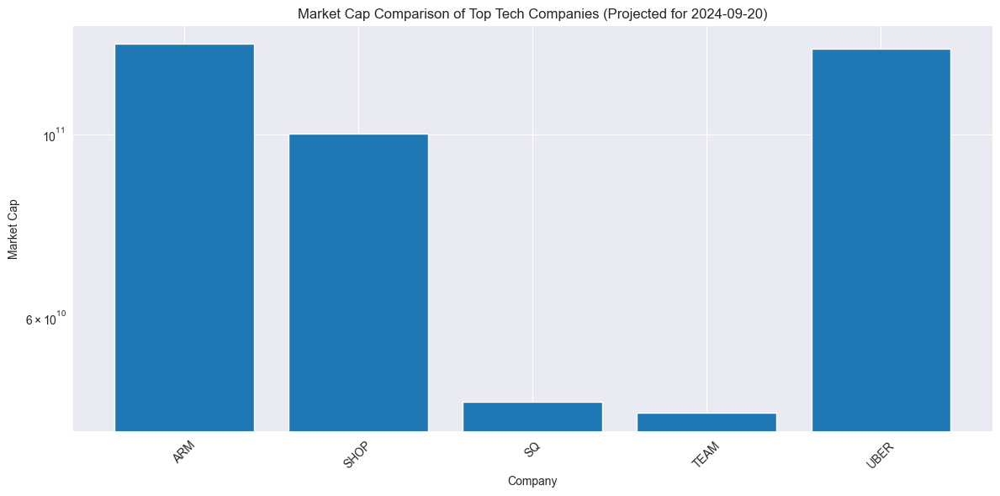

In [136]:
plt.figure(figsize=(12, 6))
plt.bar(df_top5['ticker'], df_top5['marketcap'])
plt.title('Market Cap Comparison of Top Tech Companies (Projected for 2024-09-20)')
plt.xlabel('Company')
plt.ylabel('Market Cap')
plt.yscale('log')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

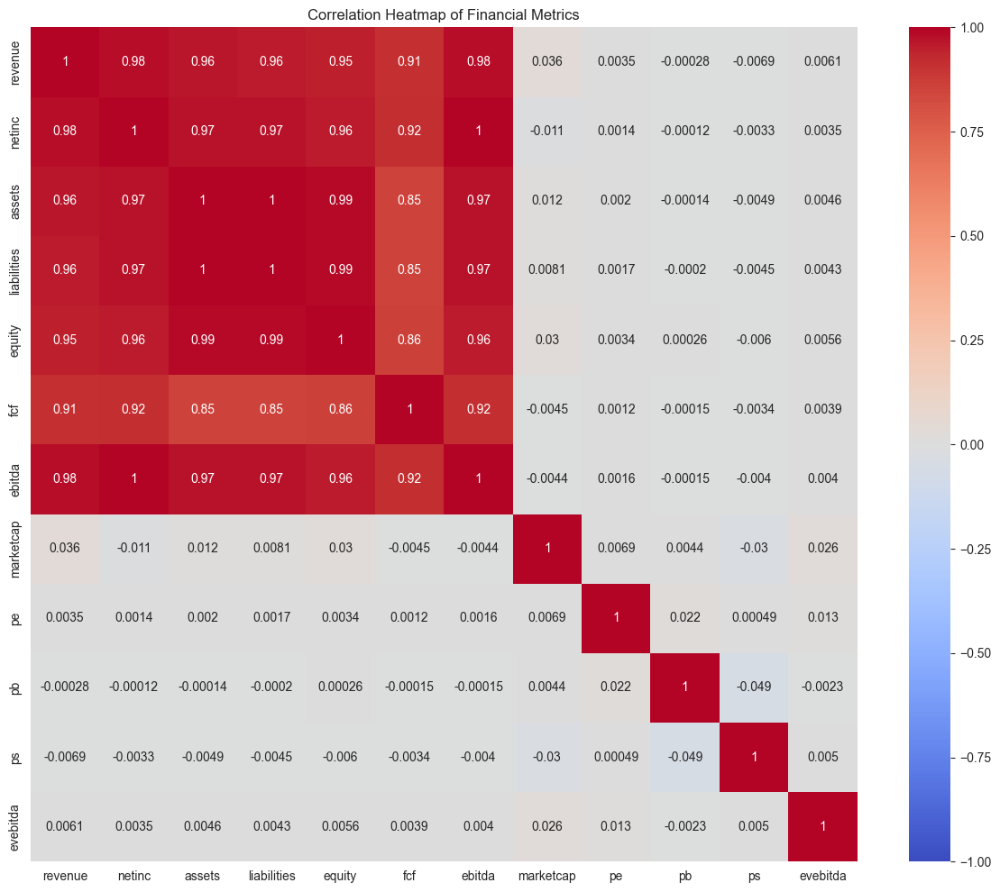

In [138]:
financial_metrics = ['revenue', 'netinc', 'assets', 'liabilities', 'equity', 'fcf', 'ebitda', 'marketcap', 'pe', 'pb', 'ps', 'evebitda']
correlation_matrix = df[financial_metrics].corr()

# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation Heatmap of Financial Metrics')
plt.tight_layout()
plt.show()

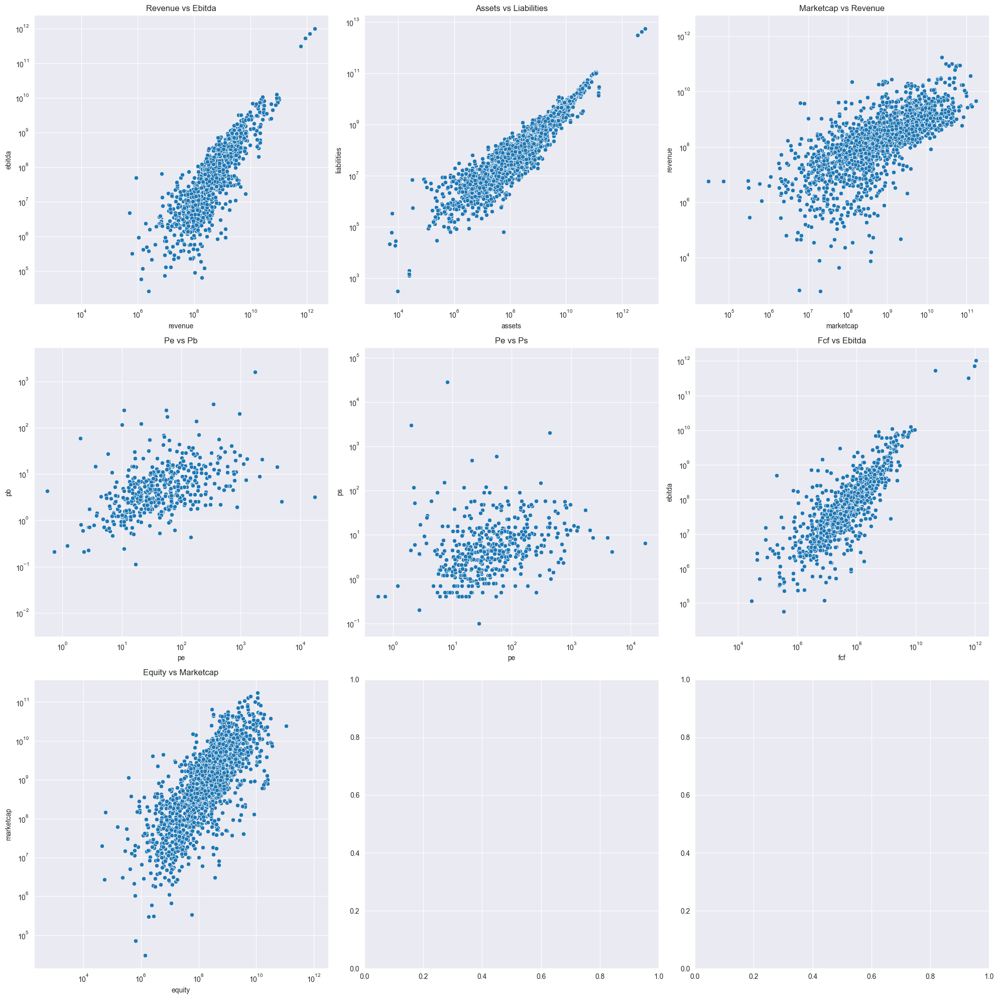

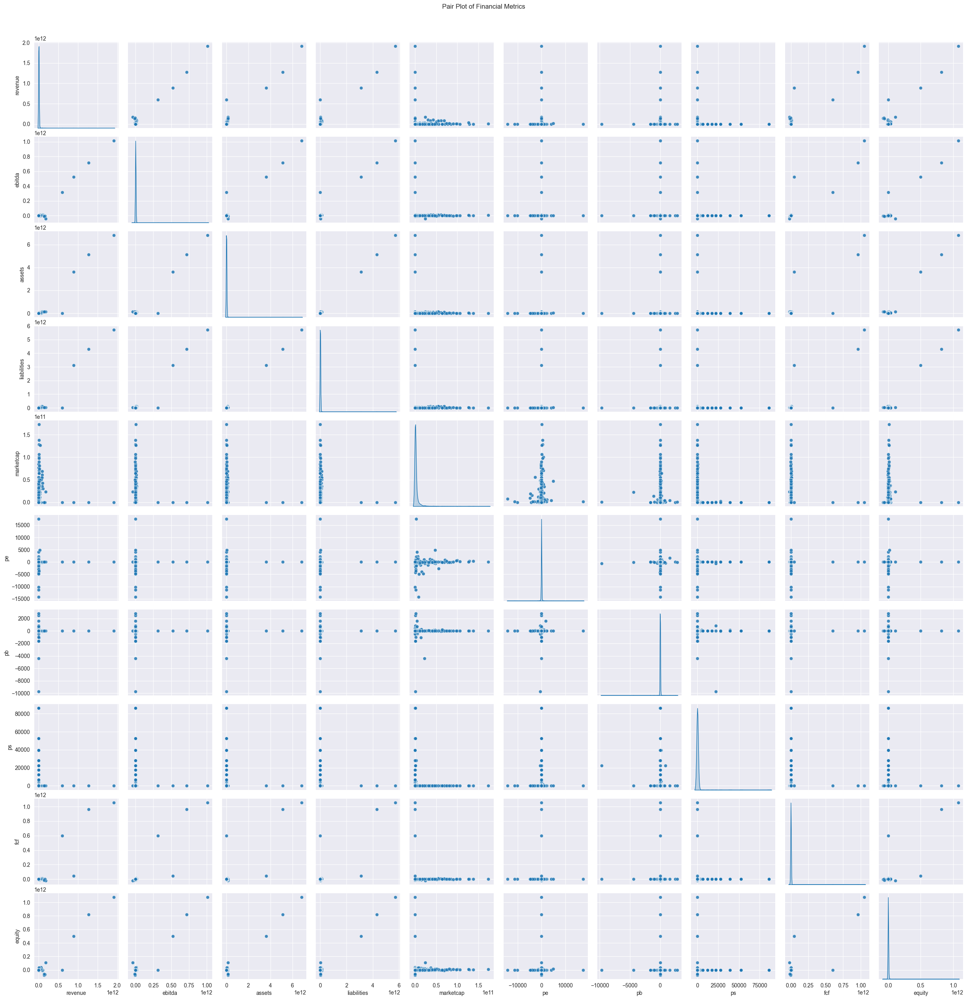

In [139]:
metric_pairs = [
    ('revenue', 'ebitda'),
    ('assets', 'liabilities'),
    ('marketcap', 'revenue'),
    ('pe', 'pb'),
    ('pe', 'ps'),
    ('fcf', 'ebitda'),
    ('equity', 'marketcap')
]

# Create scatter plots
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
axes = axes.flatten()

for i, (x, y) in enumerate(metric_pairs):
    sns.scatterplot(data=df, x=x, y=y, ax=axes[i])
    axes[i].set_title(f'{x.capitalize()} vs {y.capitalize()}')
    axes[i].set_xscale('log')
    axes[i].set_yscale('log')
plt.tight_layout()
plt.show()

# Create pair plots
sns.pairplot(df[['revenue', 'ebitda', 'assets', 'liabilities', 'marketcap', 'pe', 'pb', 'ps', 'fcf', 'equity']], 
             diag_kind='kde', plot_kws={'alpha': 0.6})
plt.suptitle('Pair Plot of Financial Metrics', y=1.02)
plt.show()

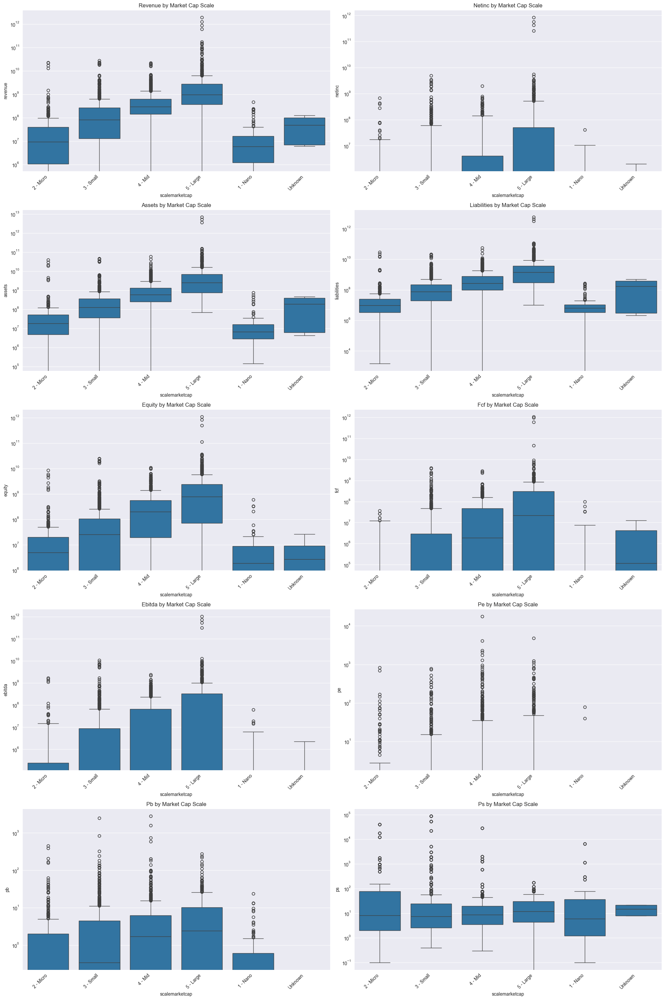

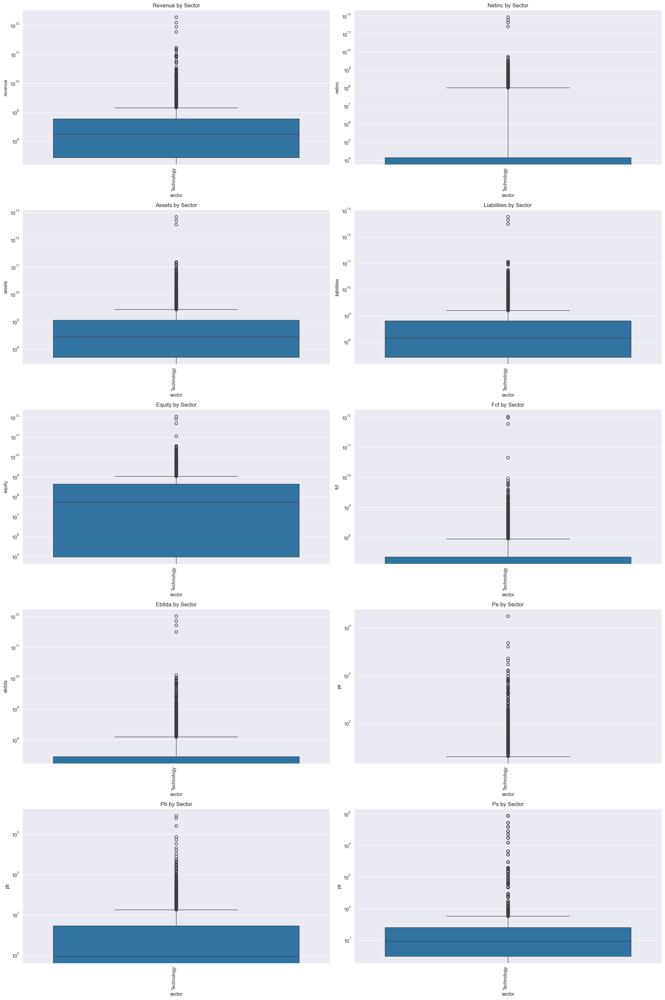

In [141]:
metrics = ['revenue', 'netinc', 'assets', 'liabilities', 'equity', 'fcf', 'ebitda', 'pe', 'pb', 'ps']

# For market cap scales
fig, axes = plt.subplots(5, 2, figsize=(20, 30))
axes = axes.flatten()

for i, metric in enumerate(metrics):
    sns.boxplot(x='scalemarketcap', y=metric, data=df, ax=axes[i])
    axes[i].set_title(f'{metric.capitalize()} by Market Cap Scale')
    axes[i].set_yscale('log')
    ticks = axes[i].get_xticks()
    axes[i].set_xticks(ticks)
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()
plt.show()

# For sectors
fig, axes = plt.subplots(5, 2, figsize=(20, 30))
axes = axes.flatten()

for i, metric in enumerate(metrics):
    sns.boxplot(x='sector', y=metric, data=df, ax=axes[i])
    axes[i].set_title(f'{metric.capitalize()} by Sector')
    axes[i].set_yscale('log')
    ticks = axes[i].get_xticks()
    axes[i].set_xticks(ticks)
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90, ha='right')
plt.tight_layout()
plt.show()

<Figure size 2000x2000 with 0 Axes>

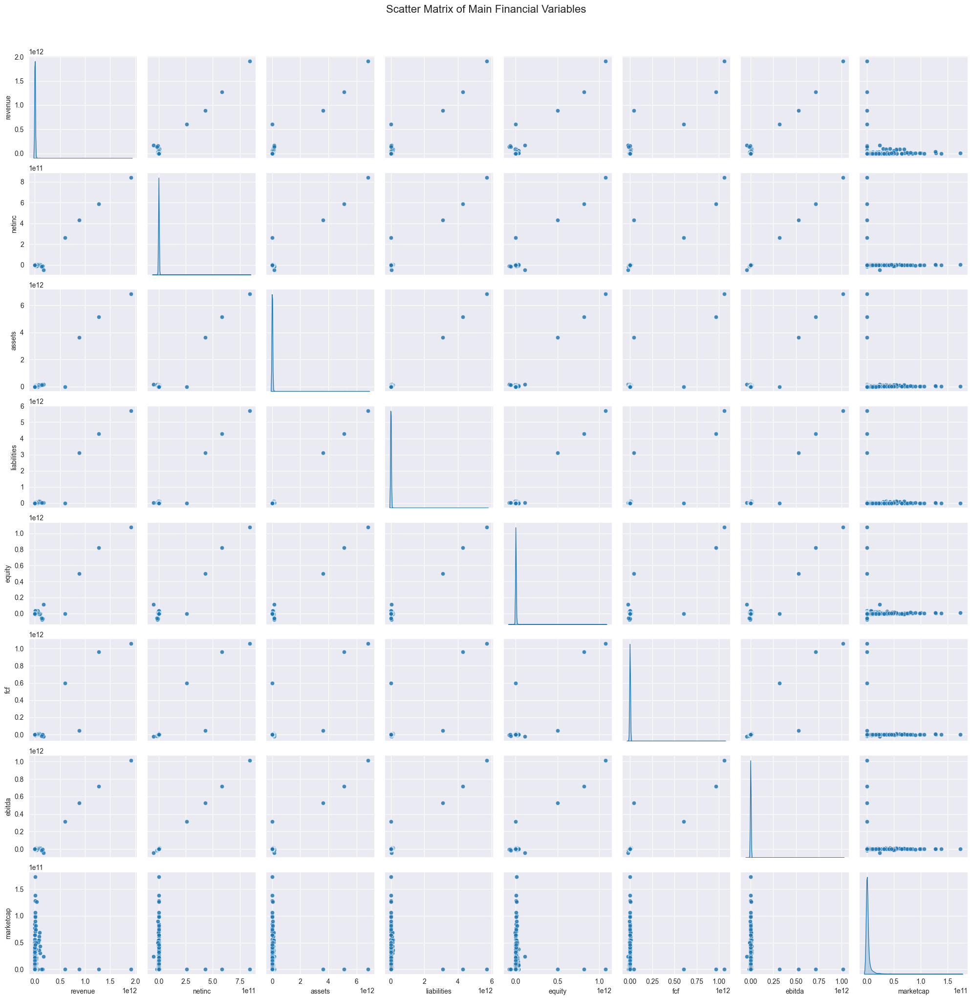

In [142]:
main_variables = ['revenue', 'netinc', 'assets', 'liabilities', 'equity', 'fcf', 'ebitda', 'marketcap']

# Create the scatter matrix
plt.figure(figsize=(20, 20))
sns.pairplot(df[main_variables], diag_kind='kde', plot_kws={'alpha': 0.6})
plt.suptitle('Scatter Matrix of Main Financial Variables', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

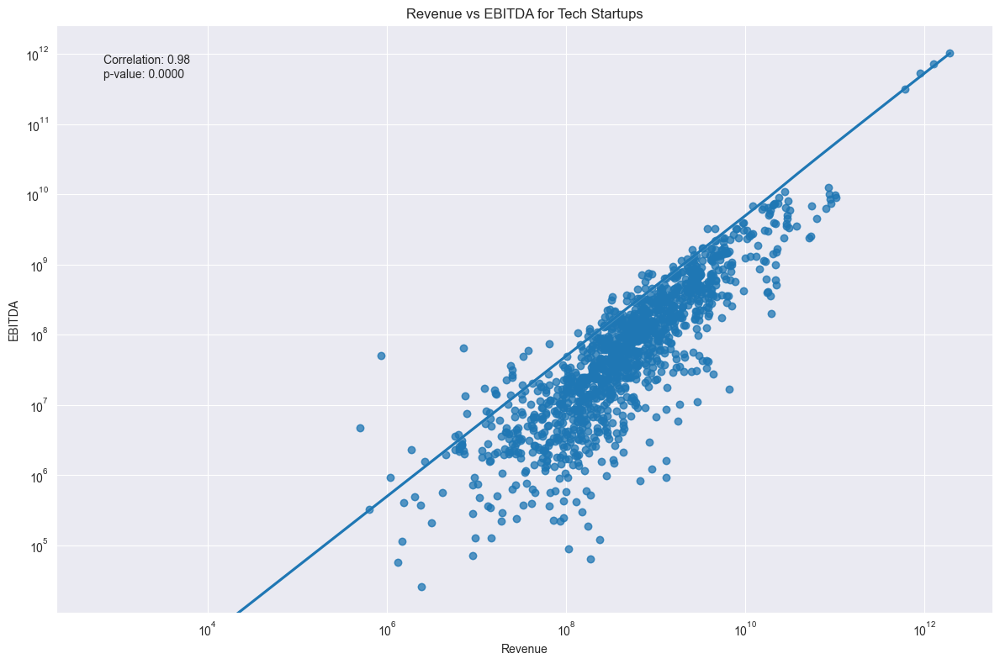

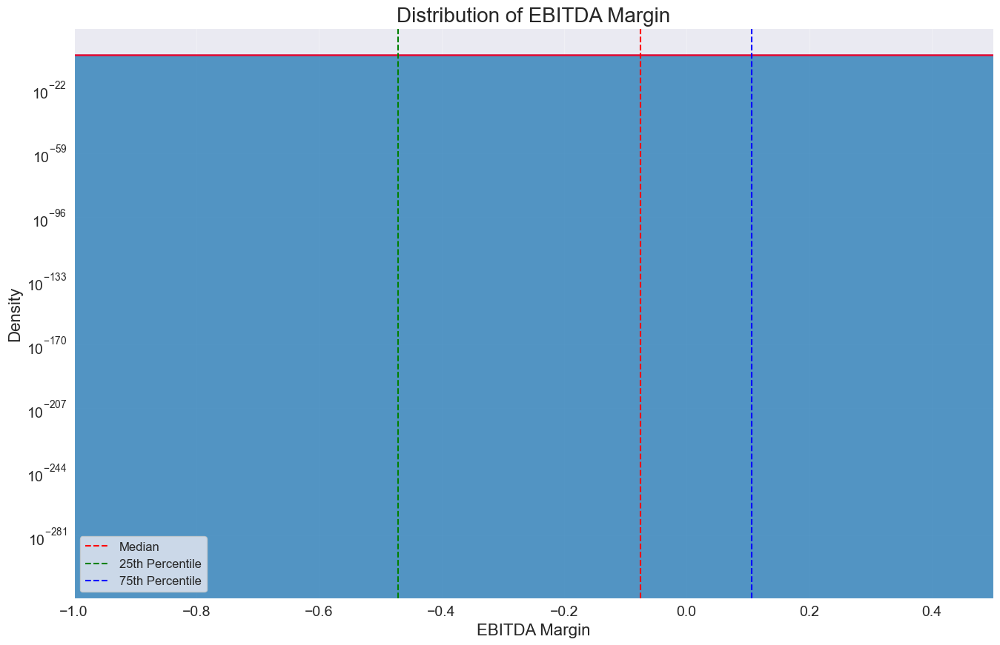

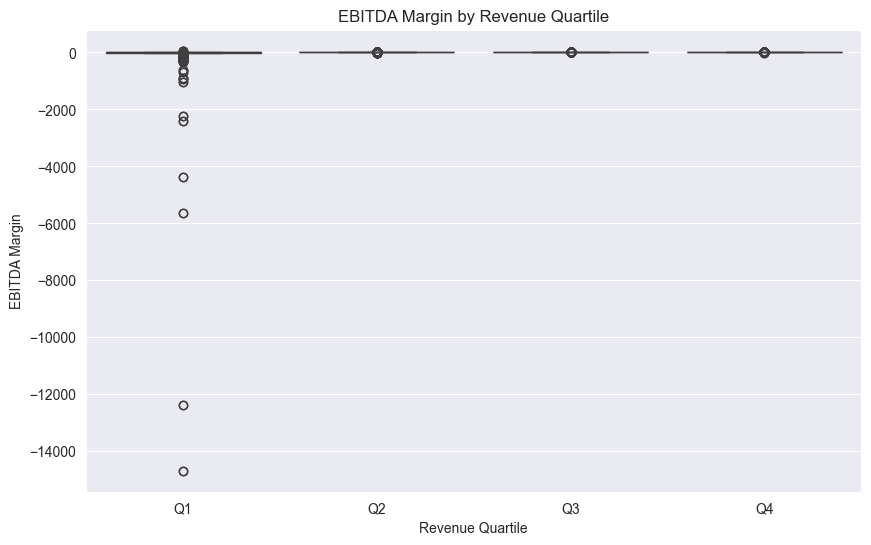

In [152]:
from scipy import stats
# Create a scatter plot with regression line
plt.figure(figsize=(12, 8))
sns.regplot(x='revenue', y='ebitda', data=df, scatter_kws={'alpha':0.5})
plt.title('Revenue vs EBITDA for Tech Startups')
plt.xlabel('Revenue')
plt.ylabel('EBITDA')
plt.xscale('log')
plt.yscale('log')

# Calculate correlation coefficient and p-value
correlation, p_value = stats.pearsonr(df['revenue'], df['ebitda'])

# Add correlation information to the plot
plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}\np-value: {p_value:.4f}', 
         transform=plt.gca().transAxes, verticalalignment='top')
plt.tight_layout()
plt.show()

# Calculate EBITDA margin
df['ebitda_margin'] = df['ebitda'] / df['revenue']

# Plot EBITDA margin distribution
plt.figure(figsize=(16, 10))

# Filter out infinite values
ebitda_margin_filtered = df['ebitda_margin'][~np.isinf(df['ebitda_margin'])]

sns.histplot(ebitda_margin_filtered, bins=100, kde=False, stat='density')
sns.kdeplot(ebitda_margin_filtered, color='crimson', linewidth=2)

plt.title('Distribution of EBITDA Margin', fontsize=20)
plt.xlabel('EBITDA Margin', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xlim(-1, 0.5)  # Adjusted based on IQR and median
plt.yscale('log')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(alpha=0.3)

# Add vertical lines for key statistics
plt.axvline(ebitda_margin_filtered.median(), color='red', linestyle='--', label='Median')
plt.axvline(ebitda_margin_filtered.quantile(0.25), color='green', linestyle='--', label='25th Percentile')
plt.axvline(ebitda_margin_filtered.quantile(0.75), color='blue', linestyle='--', label='75th Percentile')

plt.legend(fontsize=12)
plt.show()

# Analyze EBITDA margin by revenue quartiles
df['revenue_quartile'] = pd.qcut(df['revenue'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
plt.figure(figsize=(10, 6))
sns.boxplot(x='revenue_quartile', y='ebitda_margin', data=df)
plt.title('EBITDA Margin by Revenue Quartile')
plt.xlabel('Revenue Quartile')
plt.ylabel('EBITDA Margin')
plt.show()

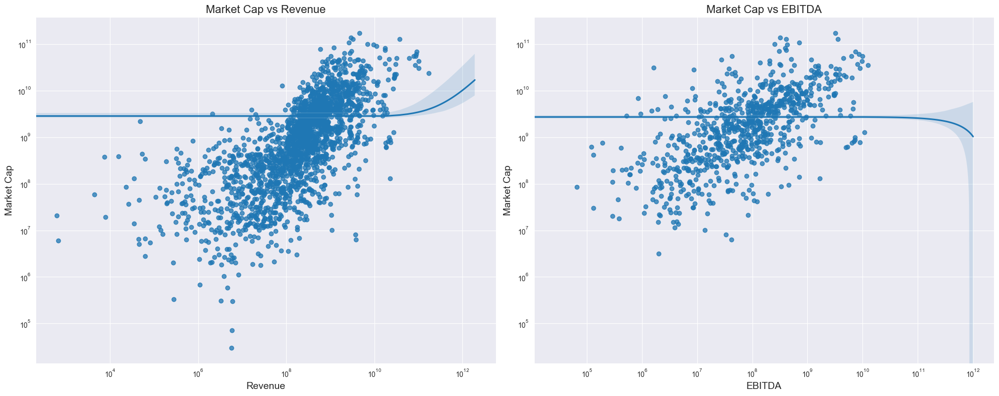

Correlation between Market Cap and Revenue: 0.0364
Correlation between Market Cap and EBITDA: -0.0044


In [153]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Market Cap vs Revenue
sns.regplot(x='revenue', y='marketcap', data=df, ax=ax1, scatter_kws={'alpha':0.5})
ax1.set_title('Market Cap vs Revenue', fontsize=16)
ax1.set_xlabel('Revenue', fontsize=14)
ax1.set_ylabel('Market Cap', fontsize=14)
ax1.set_xscale('log')
ax1.set_yscale('log')

# Market Cap vs EBITDA
sns.regplot(x='ebitda', y='marketcap', data=df, ax=ax2, scatter_kws={'alpha':0.5})
ax2.set_title('Market Cap vs EBITDA', fontsize=16)
ax2.set_xlabel('EBITDA', fontsize=14)
ax2.set_ylabel('Market Cap', fontsize=14)
ax2.set_xscale('log')
ax2.set_yscale('log')
plt.tight_layout()
plt.show()

# Calculate and print correlation coefficients
corr_revenue = df['marketcap'].corr(df['revenue'])
corr_ebitda = df['marketcap'].corr(df['ebitda'])

print(f"Correlation between Market Cap and Revenue: {corr_revenue:.4f}")
print(f"Correlation between Market Cap and EBITDA: {corr_ebitda:.4f}")

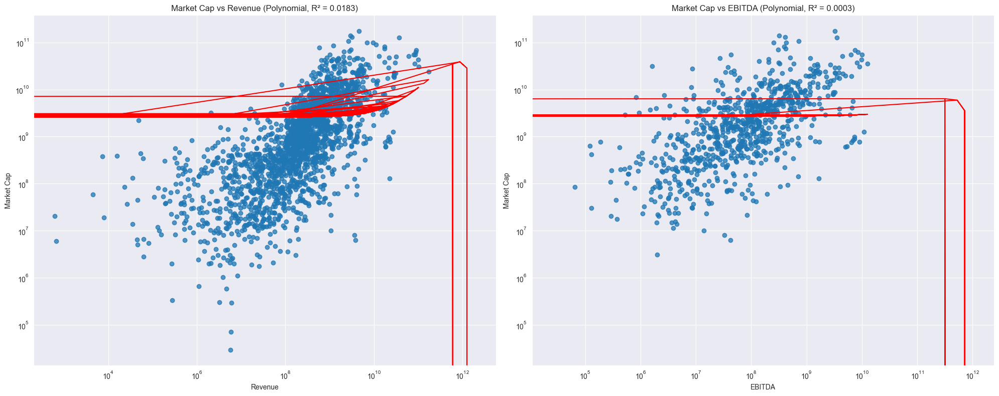

Correlation between Market Cap and assets: 0.0117
Correlation between Market Cap and ps: -0.0301
Correlation between Market Cap and pb: 0.0044

R² score for multiple regression: -0.1320
revenue: 0.1587
ebitda: -0.7205
assets: 0.0629
ps: -40474.6419
pb: -48809.4395


In [154]:
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Function for polynomial regression
def poly_regression(x, y, degree=2):
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(x.reshape(-1, 1))
    model = LinearRegression()
    model.fit(X_poly, y)
    y_pred = model.predict(X_poly)
    r2 = r2_score(y, y_pred)
    return y_pred, r2

# Polynomial regression for Revenue vs Market Cap
x_revenue = df['revenue'].values
y_marketcap = df['marketcap'].values
y_pred_revenue, r2_revenue = poly_regression(x_revenue, y_marketcap)

# Polynomial regression for EBITDA vs Market Cap
x_ebitda = df['ebitda'].values
y_pred_ebitda, r2_ebitda = poly_regression(x_ebitda, y_marketcap)

# Visualize non-linear relationships
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

ax1.scatter(x_revenue, y_marketcap, alpha=0.5)
ax1.plot(x_revenue, y_pred_revenue, color='red')
ax1.set_title(f'Market Cap vs Revenue (Polynomial, R² = {r2_revenue:.4f})')
ax1.set_xlabel('Revenue')
ax1.set_ylabel('Market Cap')
ax1.set_xscale('log')
ax1.set_yscale('log')

ax2.scatter(x_ebitda, y_marketcap, alpha=0.5)
ax2.plot(x_ebitda, y_pred_ebitda, color='red')
ax2.set_title(f'Market Cap vs EBITDA (Polynomial, R² = {r2_ebitda:.4f})')
ax2.set_xlabel('EBITDA')
ax2.set_ylabel('Market Cap')
ax2.set_xscale('log')
ax2.set_yscale('log')
plt.tight_layout()
plt.show()

# Explore additional variables
additional_vars = ['assets', 'ps', 'pb']
for var in additional_vars:
    correlation = df['marketcap'].corr(df[var])
    print(f"Correlation between Market Cap and {var}: {correlation:.4f}")

# Multiple regression with additional variables
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

X = df[['revenue', 'ebitda', 'assets', 'ps', 'pb']]
y = df['marketcap']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

r2_multi = model.score(X_test, y_test)
print(f"\nR² score for multiple regression: {r2_multi:.4f}")

# Print feature importances
for feature, importance in zip(X.columns, model.coef_):
    print(f"{feature}: {importance:.4f}")

In [156]:
df = df.replace([np.inf, -np.inf], np.nan)

In [157]:
df_clean = df.dropna(subset=['assets', 'liabilities'])

In [158]:
correlation = df_clean['assets'].corr(df_clean['liabilities'])

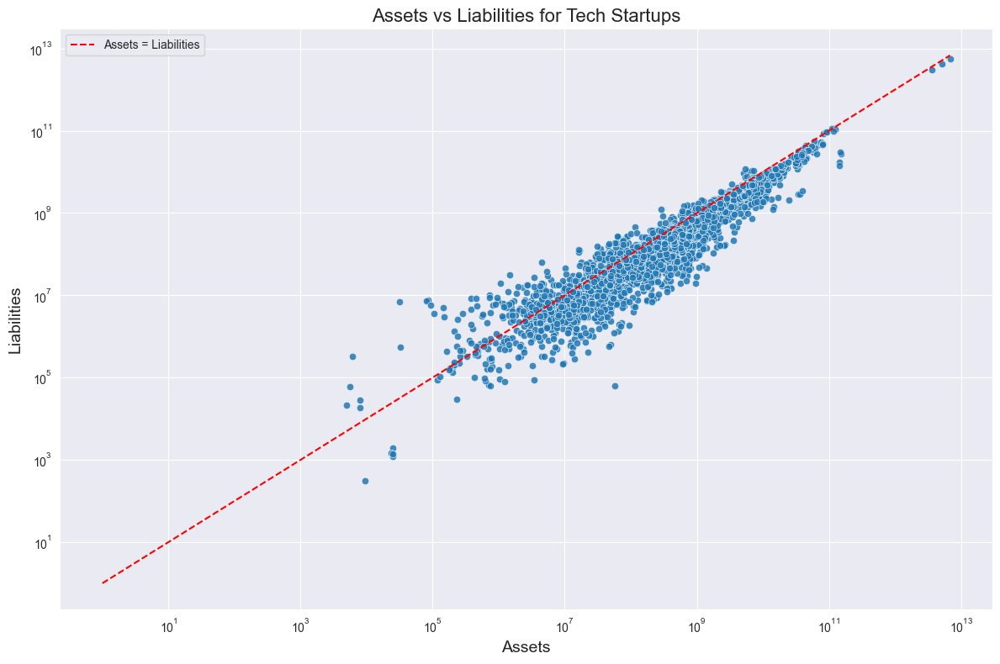

Correlation between Assets and Liabilities: 0.9995


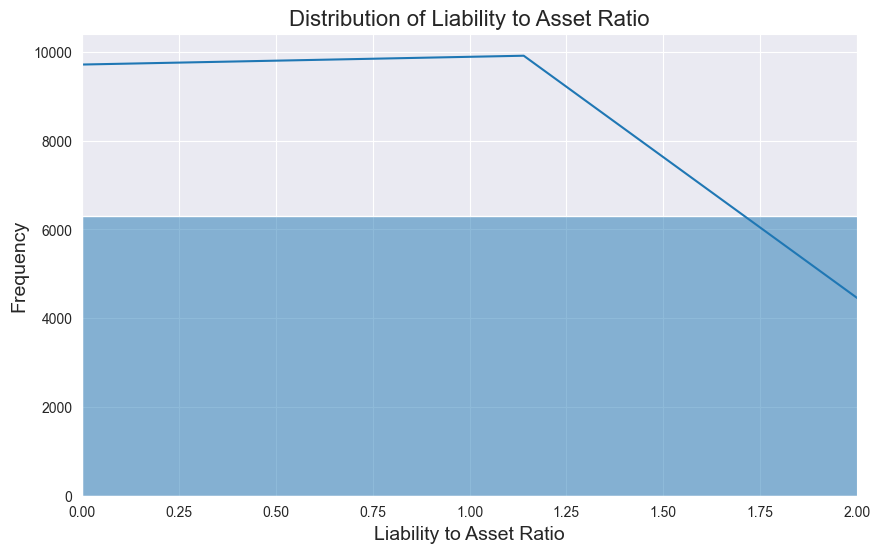

count    6394.000000
mean             inf
std              NaN
min         0.000000
25%         0.363683
50%         0.571984
75%         0.837726
max              inf
Name: liability_ratio, dtype: float64


C:\Users\Katarina\AppData\Local\Programs\Python\Python312\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


In [169]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Clean the data
df = df.replace([np.inf, -np.inf], np.nan)
df_clean = df.dropna(subset=['assets', 'liabilities'])

plt.figure(figsize=(12, 8))
sns.scatterplot(x='assets', y='liabilities', data=df_clean, alpha=0.6)
plt.title('Assets vs Liabilities for Tech Startups', fontsize=16)
plt.xlabel('Assets', fontsize=14)
plt.ylabel('Liabilities', fontsize=14)
plt.xscale('log')
plt.yscale('log')

# Add a diagonal line representing Assets = Liabilities
max_val = max(df_clean['assets'].max(), df_clean['liabilities'].max())
plt.plot([1, max_val], [1, max_val], 'r--', label='Assets = Liabilities')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate correlation coefficient
correlation = df_clean['assets'].corr(df_clean['liabilities'])
print(f"Correlation between Assets and Liabilities: {correlation:.4f}")

# Calculate the ratio of liabilities to assets
df_clean['liability_ratio'] = df_clean['liabilities'] / df_clean['assets']

plt.figure(figsize=(10, 6))
sns.histplot(df_clean['liability_ratio'], bins=50, kde=True)
plt.title('Distribution of Liability to Asset Ratio', fontsize=16)
plt.xlabel('Liability to Asset Ratio', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xlim(0, 2)  
plt.show()

print(df_clean['liability_ratio'].describe())

In [161]:
df = df.replace([np.inf, -np.inf], np.nan)

In [162]:
df_clean = df.dropna(subset=['assets', 'liabilities', 'liability_ratio'])

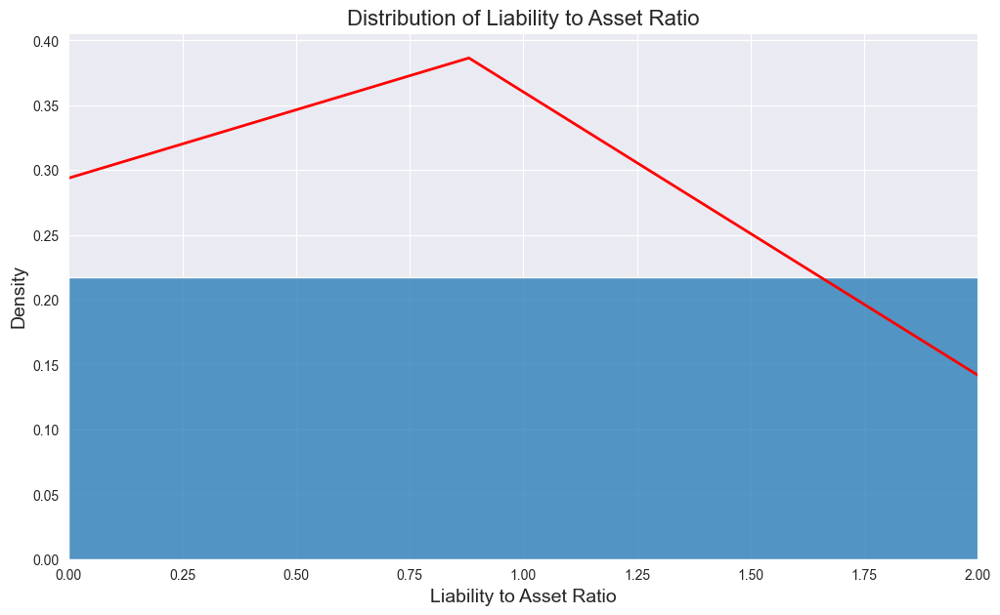

In [170]:
plt.figure(figsize=(12, 7))
sns.histplot(df_clean['liability_ratio'], bins=50, kde=False, stat='density')
sns.kdeplot(df_clean['liability_ratio'], color='red', linewidth=2)
plt.title('Distribution of Liability to Asset Ratio', fontsize=16)
plt.xlabel('Liability to Asset Ratio', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.xlim(0, 2)  
plt.show()

In [173]:
# Replace infinite values with NaN
df_clean['liability_ratio'] = df_clean['liability_ratio'].replace([np.inf, -np.inf], np.nan)

# Remove NaN values
df_clean = df_clean.dropna(subset=['liability_ratio'])
print(df_clean['liability_ratio'].describe())

count    6392.000000
mean        0.969504
std         5.035328
min         0.000000
25%         0.363497
50%         0.571486
75%         0.837357
max       226.830027
Name: liability_ratio, dtype: float64


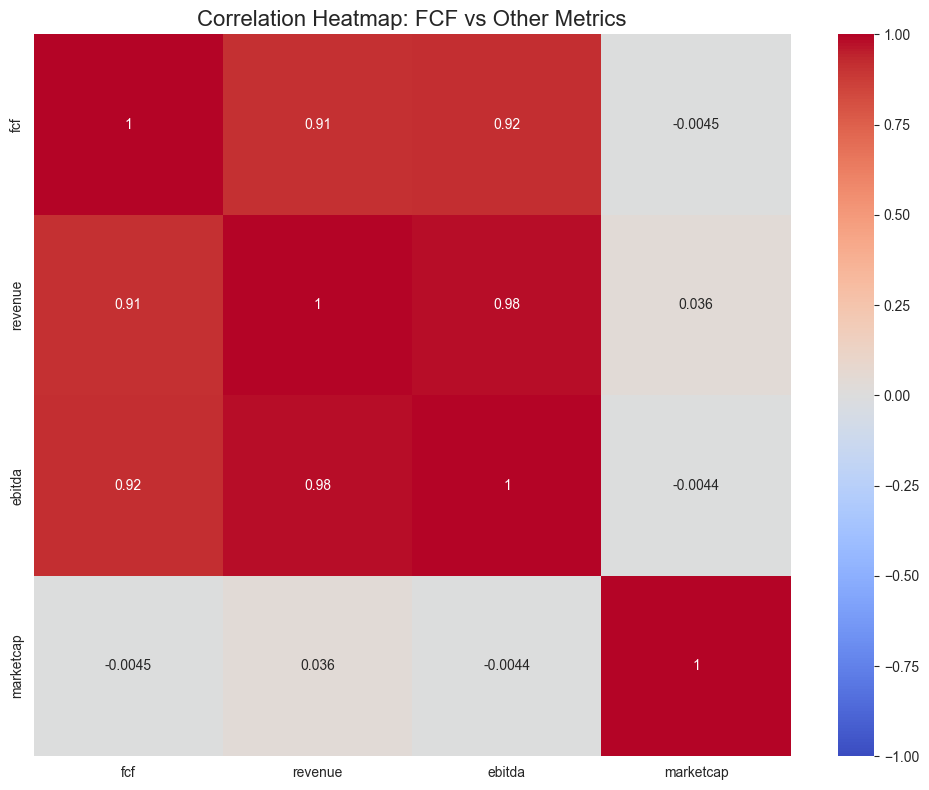

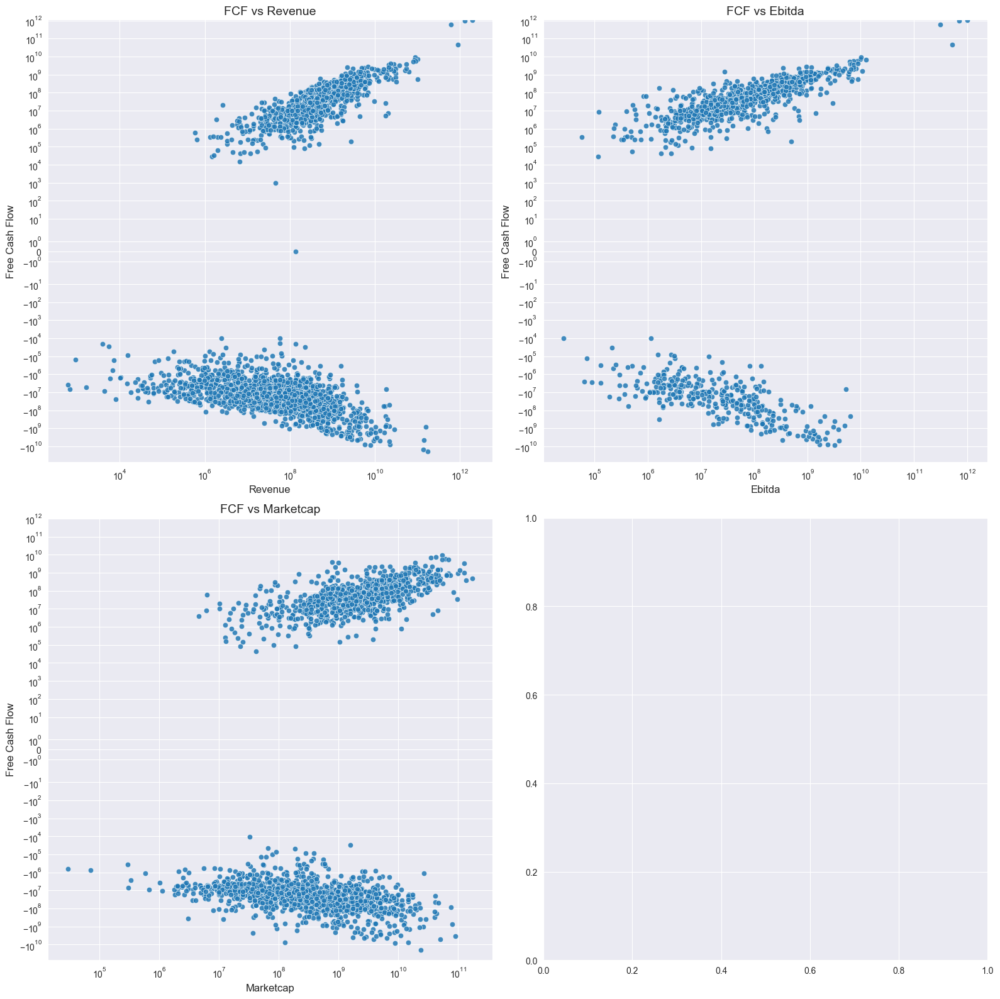

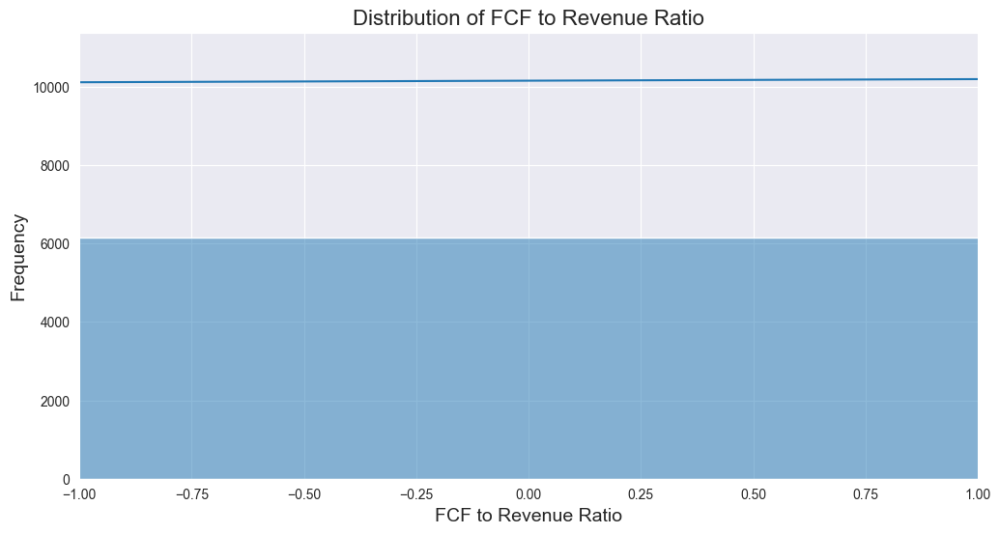

count    6388.000000
mean             NaN
std              NaN
min             -inf
25%        -0.484902
50%        -0.052237
75%         0.067585
max              inf
Name: fcf_to_revenue, dtype: float64


C:\Users\Katarina\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


In [177]:
df = df.replace([np.inf, -np.inf], np.nan)
df_clean = df.dropna(subset=['fcf', 'revenue', 'ebitda', 'marketcap'])

# Create a correlation matrix
corr_matrix = df_clean[['fcf', 'revenue', 'ebitda', 'marketcap']].corr()

# Plot correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap: FCF vs Other Metrics', fontsize=16)
plt.tight_layout()
plt.show()

# Scatter plots
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
axes = axes.ravel()

metrics = ['revenue', 'ebitda', 'marketcap']
for i, metric in enumerate(metrics):
    sns.scatterplot(x=metric, y='fcf', data=df_clean, ax=axes[i], alpha=0.6)
    axes[i].set_title(f'FCF vs {metric.capitalize()}', fontsize=14)
    axes[i].set_xlabel(metric.capitalize(), fontsize=12)
    axes[i].set_ylabel('Free Cash Flow', fontsize=12)
    axes[i].set_xscale('log')
    axes[i].set_yscale('symlog')
plt.tight_layout()
plt.show()

# Calculate FCF to Revenue ratio
df_clean['fcf_to_revenue'] = df_clean['fcf'] / df_clean['revenue']

# Plot distribution of FCF to Revenue ratio
plt.figure(figsize=(12, 6))
sns.histplot(df_clean['fcf_to_revenue'], bins=50, kde=True)
plt.title('Distribution of FCF to Revenue Ratio', fontsize=16)
plt.xlabel('FCF to Revenue Ratio', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xlim(-1, 1)  # Adjust as needed
plt.show()

print(df_clean['fcf_to_revenue'].describe())

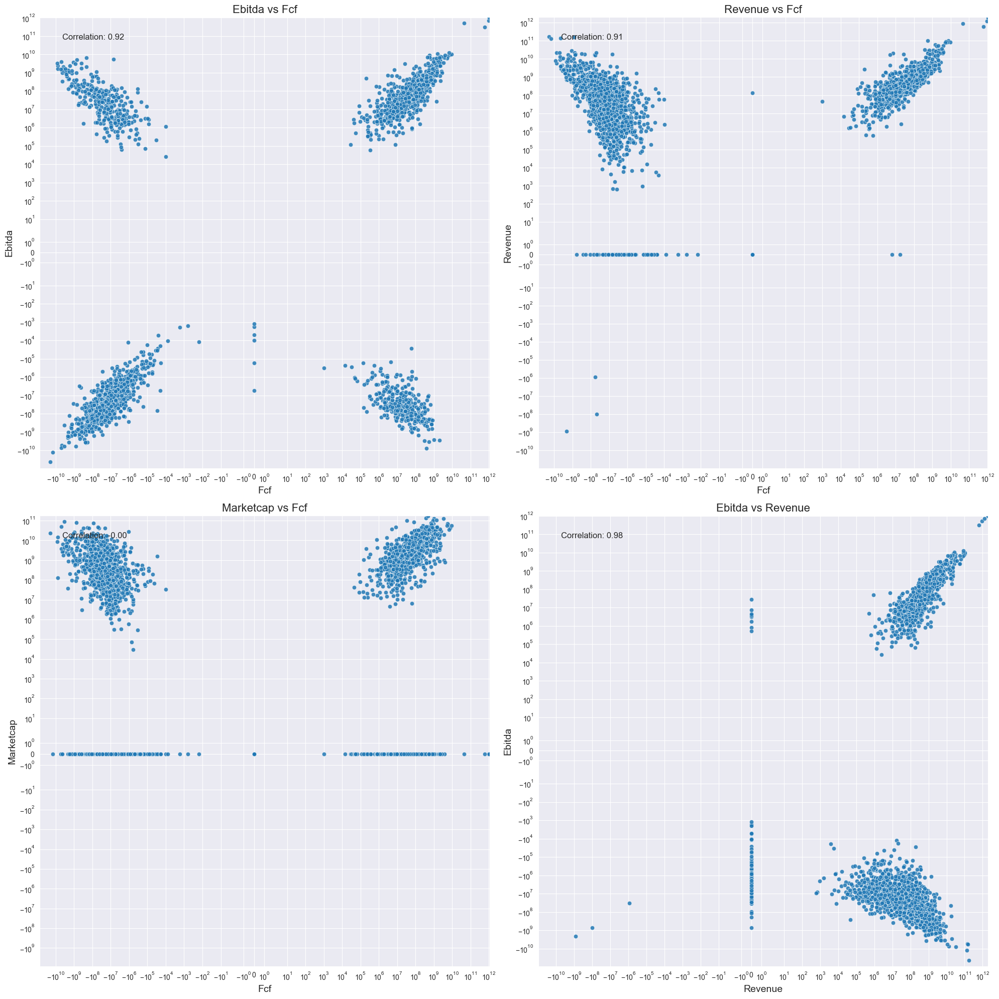

Correlation Matrix:
                fcf    ebitda   revenue  marketcap
fcf        1.000000  0.918870  0.913989  -0.004483
ebitda     0.918870  1.000000  0.983625  -0.004437
revenue    0.913989  0.983625  1.000000   0.036363
marketcap -0.004483 -0.004437  0.036363   1.000000


In [178]:
df_clean = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['fcf', 'ebitda', 'revenue', 'marketcap'])

# Create scatter plots
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
axes = axes.ravel()
pairs = [
    ('fcf', 'ebitda'),
    ('fcf', 'revenue'),
    ('fcf', 'marketcap'),
    ('revenue', 'ebitda')
]

for i, (x, y) in enumerate(pairs):
    sns.scatterplot(x=x, y=y, data=df_clean, ax=axes[i], alpha=0.6)
    axes[i].set_title(f'{y.capitalize()} vs {x.capitalize()}', fontsize=16)
    axes[i].set_xlabel(x.capitalize(), fontsize=14)
    axes[i].set_ylabel(y.capitalize(), fontsize=14)
    axes[i].set_xscale('symlog')
    axes[i].set_yscale('symlog')
    
    corr = df_clean[x].corr(df_clean[y])
    axes[i].annotate(f'Correlation: {corr:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12)
plt.tight_layout()
plt.show()

# Print correlation matrix
corr_matrix = df_clean[['fcf', 'ebitda', 'revenue', 'marketcap']].corr()
print("Correlation Matrix:")
print(corr_matrix)

In [180]:
# Ensure we're using the cleaned dataset
df_clean = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['revenue', 'ebitda', 'assets', 'liabilities', 'fcf'])

# Calculate correlations
correlations = {
    'Revenue & EBITDA': df_clean['revenue'].corr(df_clean['ebitda']),
    'Assets & Liabilities': df_clean['assets'].corr(df_clean['liabilities']),
    'FCF & EBITDA': df_clean['fcf'].corr(df_clean['ebitda']),
    'FCF & Revenue': df_clean['fcf'].corr(df_clean['revenue']),
}

for pair, corr in correlations.items():
    print(f"{pair}: {corr:.6f}")

Revenue & EBITDA: 0.983625
Assets & Liabilities: 0.999511
FCF & EBITDA: 0.918870
FCF & Revenue: 0.913989


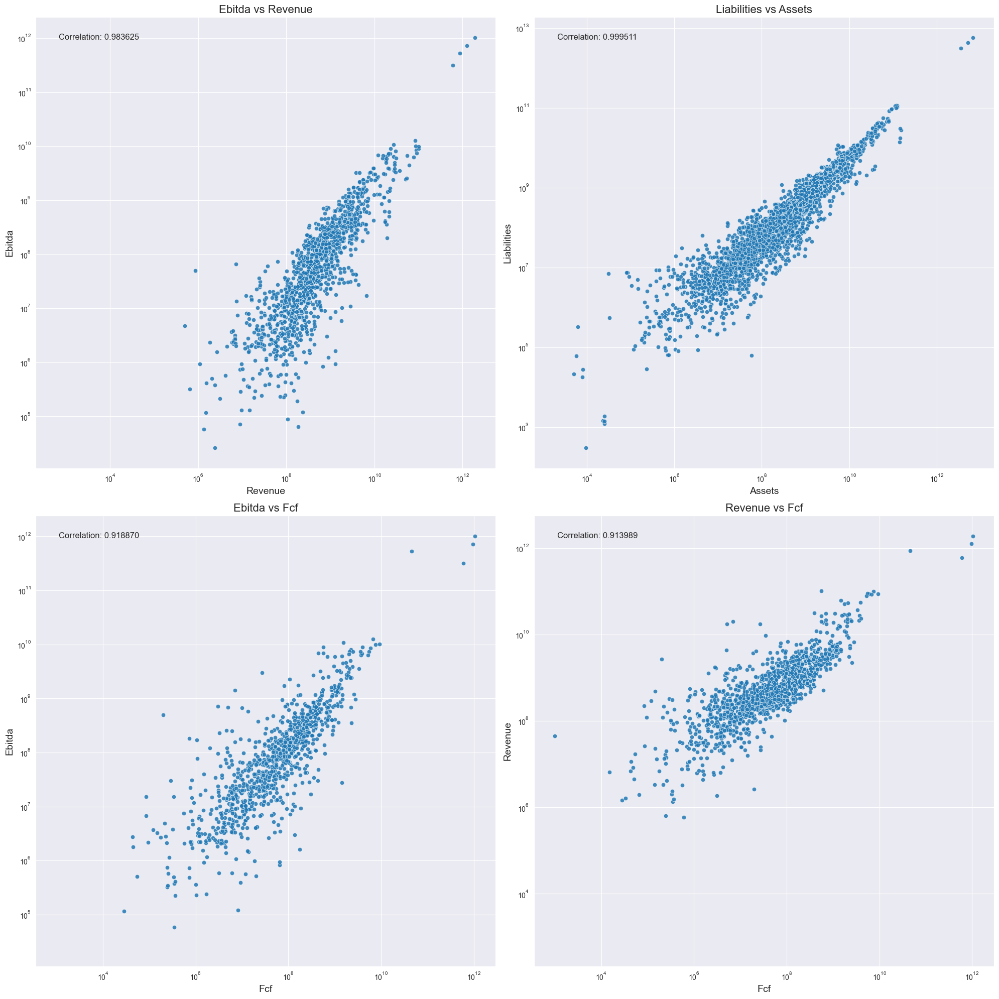

In [181]:
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
axes = axes.flatten()

pairs = [
    ('revenue', 'ebitda'),
    ('assets', 'liabilities'),
    ('fcf', 'ebitda'),
    ('fcf', 'revenue')
]
for i, (x, y) in enumerate(pairs):
    sns.scatterplot(x=x, y=y, data=df_clean, ax=axes[i], alpha=0.6)
    axes[i].set_title(f'{y.capitalize()} vs {x.capitalize()}', fontsize=16)
    axes[i].set_xlabel(x.capitalize(), fontsize=14)
    axes[i].set_ylabel(y.capitalize(), fontsize=14)
    axes[i].set_xscale('log')
    axes[i].set_yscale('log')
    
    corr = df_clean[x].corr(df_clean[y])
    axes[i].annotate(f'Correlation: {corr:.6f}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12)
plt.tight_layout()
plt.show()

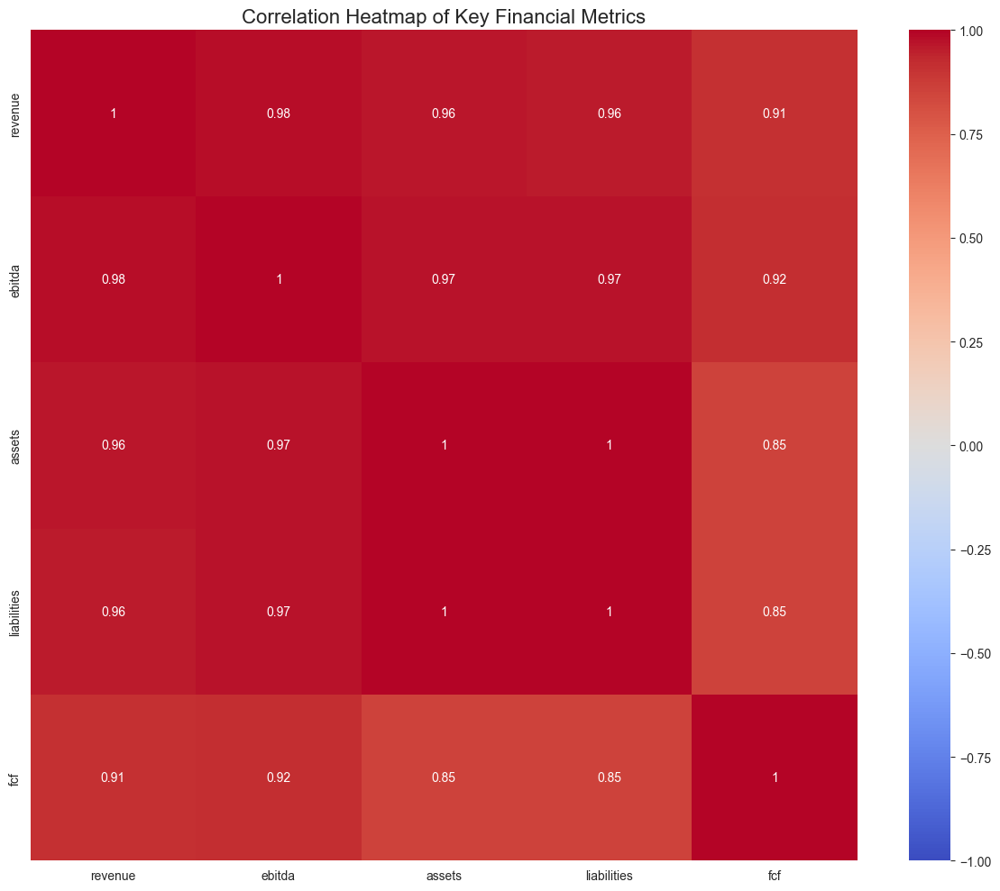

In [182]:
variables = ['revenue', 'ebitda', 'assets', 'liabilities', 'fcf']
corr_matrix = df_clean[variables].corr()

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation Heatmap of Key Financial Metrics', fontsize=16)
plt.tight_layout()
plt.show()

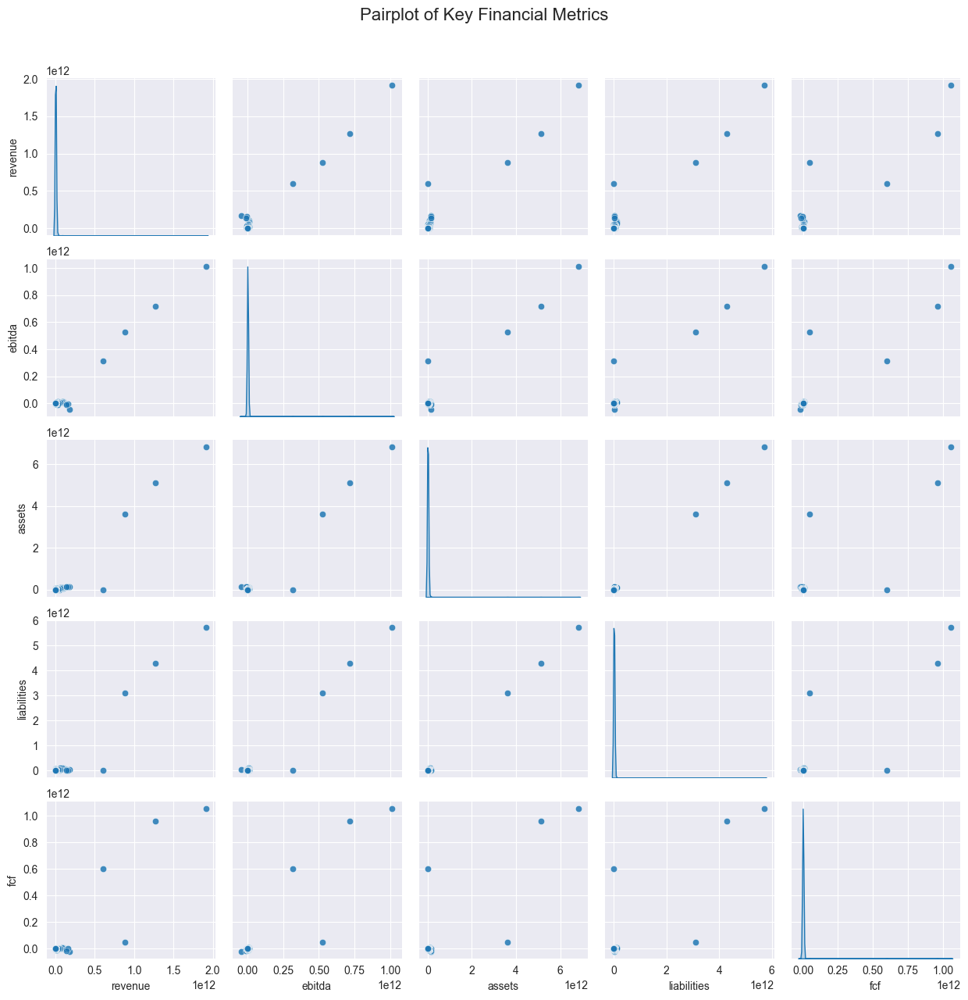

In [183]:
variables = ['revenue', 'ebitda', 'assets', 'liabilities', 'fcf']

# Create the pairplot
sns.pairplot(df_clean[variables], diag_kind='kde', plot_kws={'alpha': 0.6})
plt.suptitle('Pairplot of Key Financial Metrics', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

In [186]:
import plotly.graph_objects as go
variables = ['revenue', 'ebitda', 'assets', 'liabilities', 'fcf']

# Normalize the data for better visualization
df_normalized = df_clean[variables].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

# Create the parallel coordinates plot
fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = df_clean['revenue'],
                    colorscale = 'Viridis',
                    showscale = True),
        dimensions = [dict(range = [0, 1],
                           label = col,
                           values = df_normalized[col])
                      for col in df_normalized.columns]
    )
)

fig.update_layout(
    title='Parallel Coordinates Plot of Key Financial Metrics',
    height=600
)
fig.show()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 376622 entries, 0 to 376621
Data columns (total 78 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   ticker                            376622 non-null  object 
 1   name                              376622 non-null  object 
 2   sector                            376622 non-null  object 
 3   industry                          376622 non-null  object 
 4   scalemarketcap                    376622 non-null  object 
 5   firstpricedate                    376622 non-null  object 
 6   lastpricedate                     376622 non-null  object 
 7   revenue                           376622 non-null  float64
 8   netinc                            376622 non-null  float64
 9   assets                            376622 non-null  float64
 10  liabilities                       376622 non-null  float64
 11  equity                            376622 non-null  f

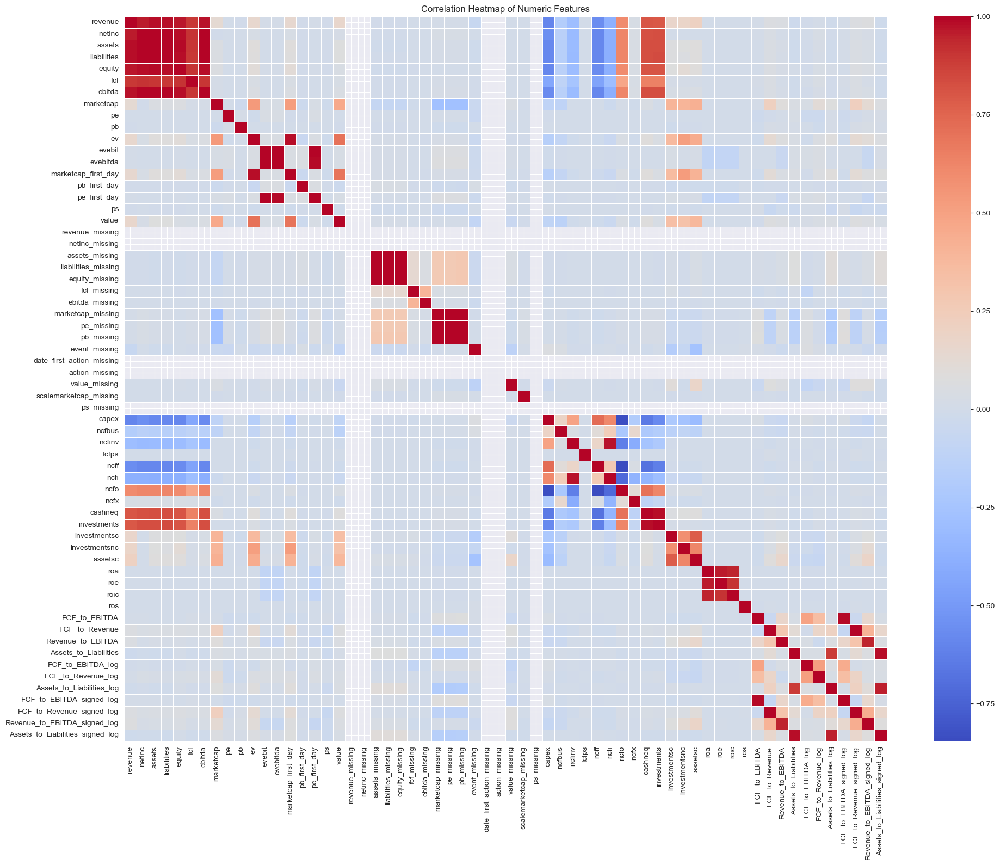


Top 20 Correlations:
liabilities               assets                       0.999622
netinc                    ebitda                       0.998745
ebitda                    assets                       0.997677
liabilities               ebitda                       0.997523
pe_missing                marketcap_missing            0.996613
evebit                    evebitda                     0.995970
pb_missing                marketcap_missing            0.995943
FCF_to_Revenue            FCF_to_Revenue_signed_log    0.995549
pe_missing                pb_missing                   0.994191
liabilities               netinc                       0.994051
netinc                    assets                       0.994019
evebit                    pe_first_day                 0.993655
evebitda                  pe_first_day                 0.990104
assets                    equity                       0.987887
FCF_to_EBITDA_signed_log  FCF_to_EBITDA                0.986090
equity            

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

file_path = r'C:\Users\Katarina\OneDrive\Desktop\final_cleaned_financial_data_v2.csv'
df = pd.read_csv(file_path)
print(df.info())
print(df.head())
print(df.describe())

# Check for missing values
print(df.isnull().sum())

numeric_columns = df.select_dtypes(include=[np.number]).columns
non_numeric_columns = df.select_dtypes(exclude=[np.number]).columns

print("Numeric columns:", len(numeric_columns))
print("Non-numeric columns:", len(non_numeric_columns))

# Calculate correlation matrix for numeric columns
correlation_matrix = df[numeric_columns].corr()

# Plot correlation heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Numeric Features')
plt.tight_layout()
plt.show()

# Display top correlations
top_correlations = (correlation_matrix.abs().unstack()
                    .sort_values(kind="quicksort", ascending=False)
                    .drop_duplicates())
print("\nTop 20 Correlations:")
print(top_correlations[1:21])  # Exclude self-correlations (always 1.0)

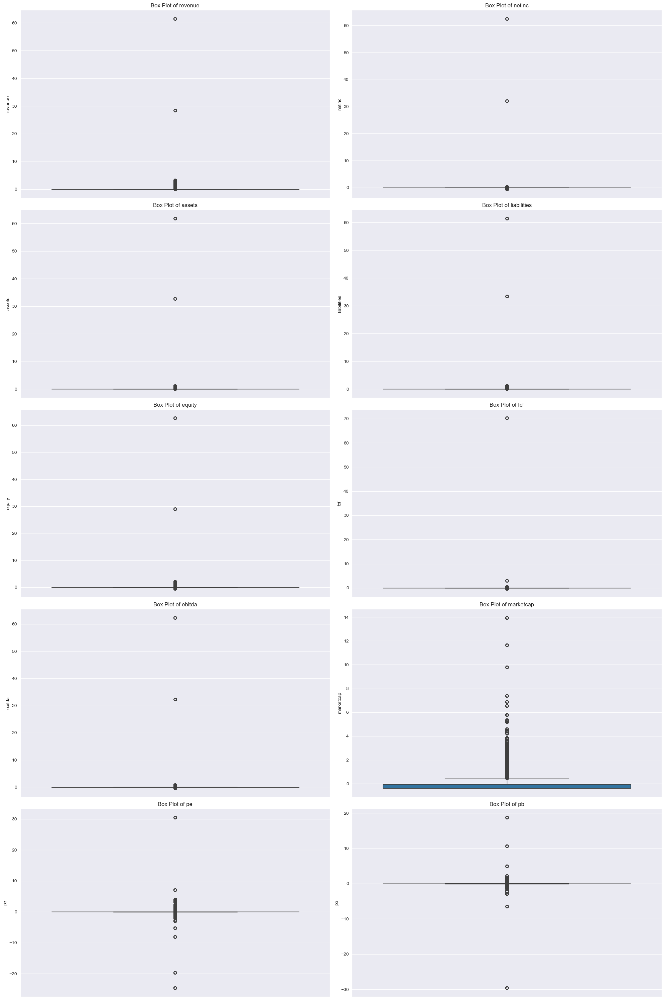

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
file_path = r'C:\Users\Katarina\OneDrive\Desktop\final_cleaned_financial_data_v2.csv'
df = pd.read_csv(file_path)

# Select a subset of important numeric columns
numeric_cols = ['revenue', 'netinc', 'assets', 'liabilities', 'equity', 'fcf', 'ebitda', 'marketcap', 'pe', 'pb']
fig, axes = plt.subplots(5, 2, figsize=(20, 30))
axes = axes.flatten()

for i, col in enumerate(numeric_cols):
    sns.boxplot(y=df[col], ax=axes[i])
    axes[i].set_title(f'Box Plot of {col}')
    axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

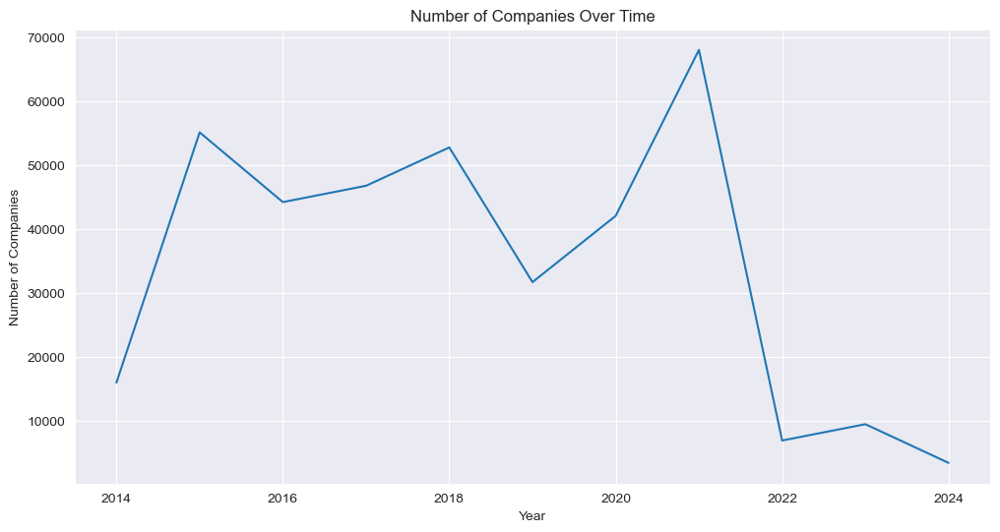

In [2]:
# Convert date columns to datetime
df['firstpricedate'] = pd.to_datetime(df['firstpricedate'])
df['lastpricedate'] = pd.to_datetime(df['lastpricedate'])

# Plot number of companies over time
df['year'] = df['firstpricedate'].dt.year
companies_per_year = df['year'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
companies_per_year.plot(kind='line')
plt.title('Number of Companies Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Companies')
plt.show()

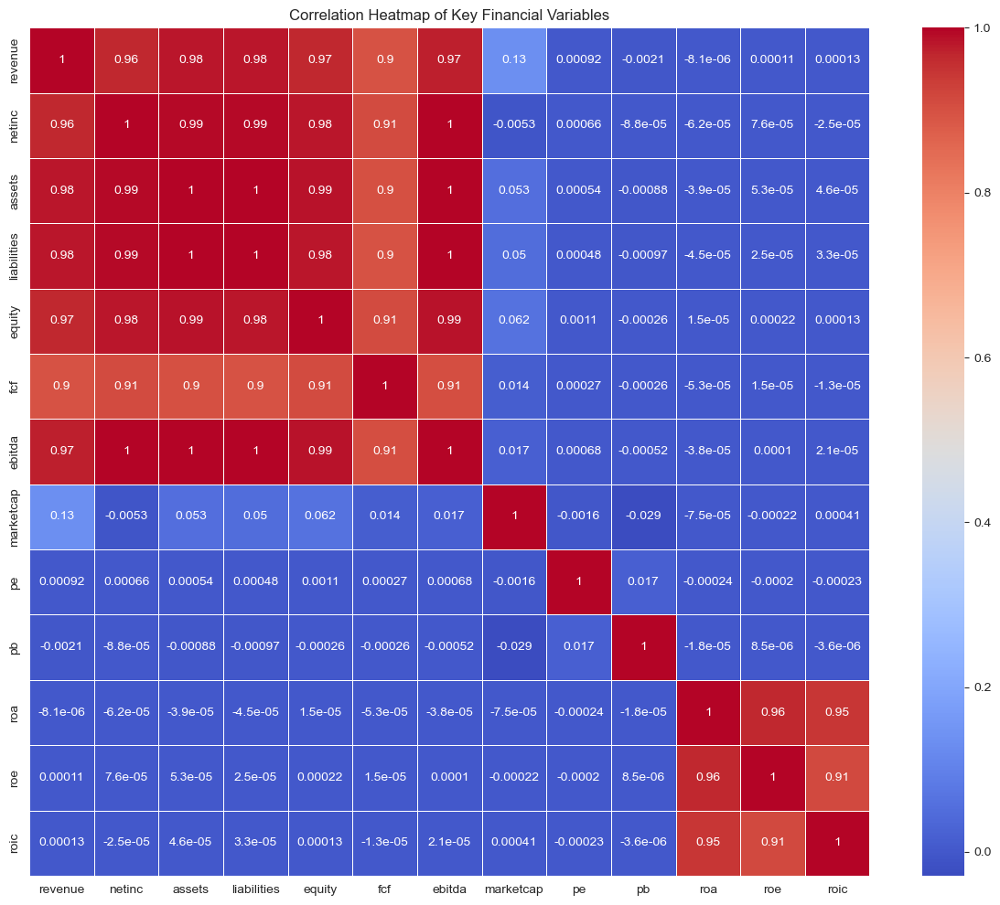

In [3]:
key_vars = ['revenue', 'netinc', 'assets', 'liabilities', 'equity', 'fcf', 'ebitda', 'marketcap', 'pe', 'pb', 'roa', 'roe', 'roic']
correlation_matrix = df[key_vars].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Key Financial Variables')
plt.tight_layout()
plt.show()

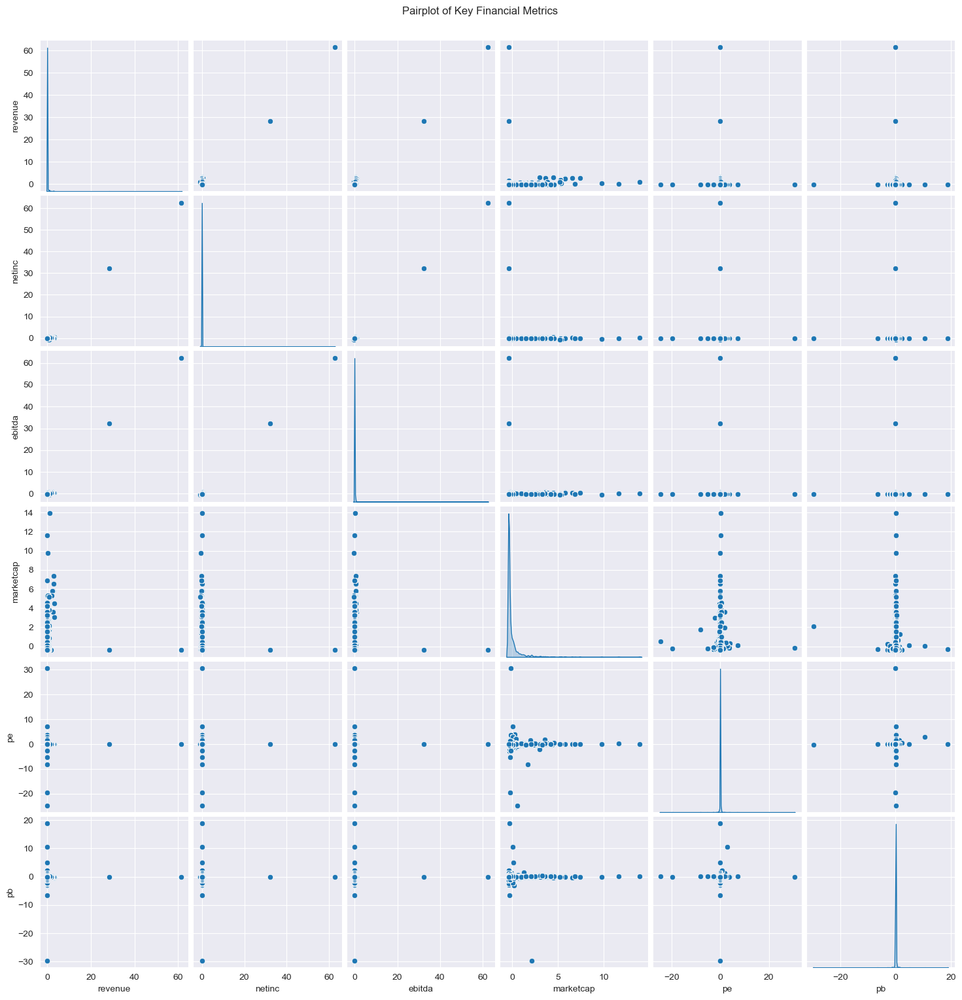

In [6]:
key_metrics = ['revenue', 'netinc', 'ebitda', 'marketcap', 'pe', 'pb']
sns.pairplot(df[key_metrics], diag_kind='kde')
plt.suptitle('Pairplot of Key Financial Metrics', y=1.02)
plt.show()

In [4]:
missing_data = df.isnull().sum().sort_values(ascending=False)
missing_percent = 100 * missing_data / len(df)
missing_table = pd.concat([missing_data, missing_percent], axis=1, keys=['Missing Values', 'Percent Missing'])
print(missing_table[missing_table['Percent Missing'] > 0])

Empty DataFrame
Columns: [Missing Values, Percent Missing]
Index: []


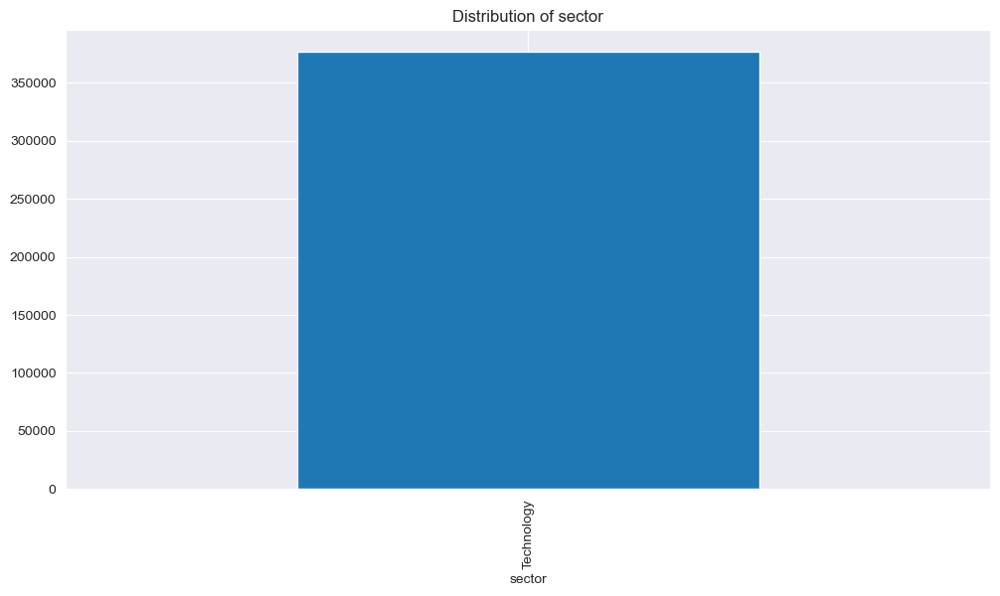

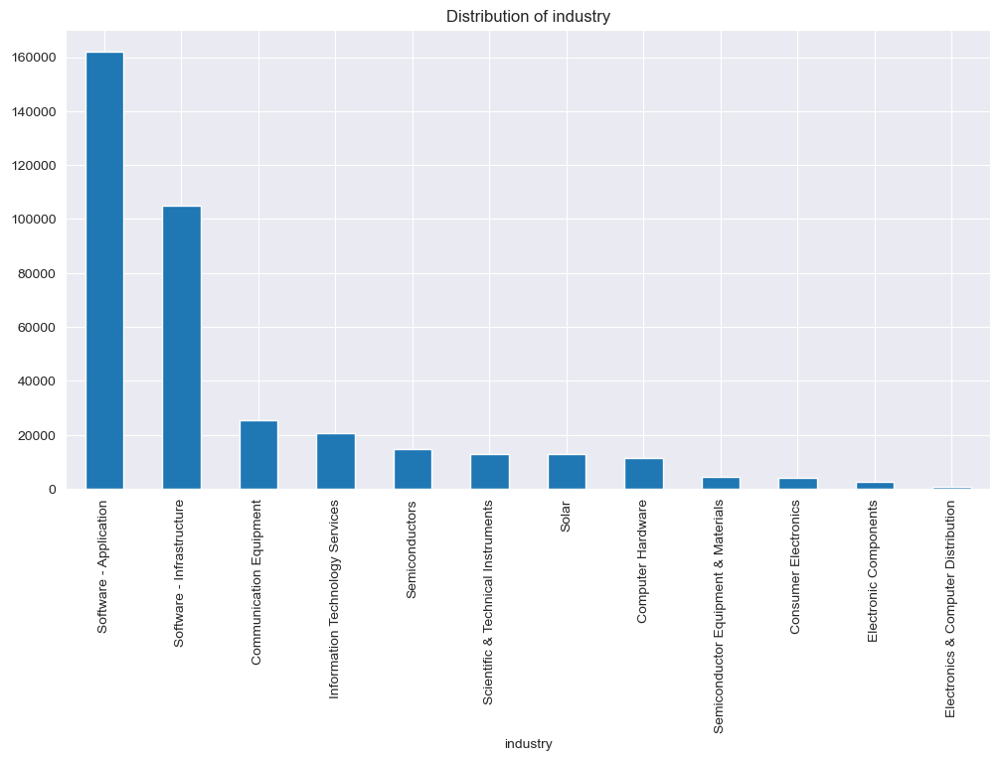

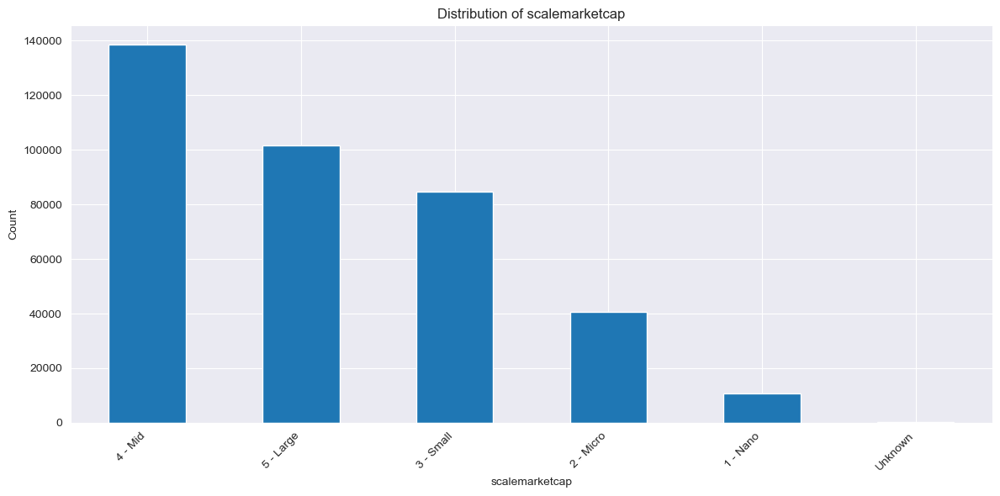

In [5]:
for col in ['sector', 'industry', 'scalemarketcap']:
    plt.figure(figsize=(12, 6))
    df[col].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {col}')
plt.xlabel(col)
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()